
# Módulo de productividad de pozos

Analisis estadístico y simulación del gasto en pozos. 

Información histórica de producción de hidrocarburos en México.

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy
import scipy.stats
from scipy.optimize import curve_fit
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

import timeit

In [2]:
pd.set_option('display.max_rows', 100_000_000)
pd.set_option('display.max_columns', 100_000_000)
pd.set_option('display.width', 1_000)
pd.set_option('precision', 2)
pd.options.display.float_format = '{:,.2f}'.format

In [3]:
import timeit
tic=timeit.default_timer()
toc=timeit.default_timer()
toc - tic #elapsed time in seconds

5.103999998823383e-05

<div class="alert alert-block alert-danger">

### <b>Check Harmonic Equation</b>
<br>
· b should be = 1, check bounds argument in harmonic_equation
<br>
· automate unique_well_list generation
<br>

</div>

In [4]:
def input_pozos(x): 
        
        global pozos
        pozos = pd.DataFrame(columns=["Campo",
                                      "Coordenadas",
                                      "Qo aceite",
                                      "Qo gas"])

        #parts=int(input("Numero de campos: "))
        parts = x

        # !!!!!! Verificar resultado de la funcion format... cambiar a integer
        
        for i in range(parts):
            campo = input("Nombre de Campo: ")
            coordenadas = input("Coordenadas: ".format(campo))
            Qo_aceite = input("Qo aceite: ".format(campo))
            Qo_gas = input("Qo gas: ".format(campo))
            df1 = pd.DataFrame(data=[[campo,coordenadas,Qo_aceite,Qo_gas]],columns=["Campo",
                                                                                    "Coordenadas",
                                                                                    "Qo aceite",
                                                                                    "Qo gas"])
            pozos = pd.concat([pozos,df1], axis=0)

        pozos.index = range(len(pozos.index))

## Estadistica - Kumaza

In [5]:
df=pd.read_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/kumaza_dca.csv',
               parse_dates=True)
display(df.head(),df.columns)

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(df.fecha,df.gasto_aceite_Mbd)
ax.set_xlabel('Fecha')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()
#df.gasto_gas_MMpcd.plot(figsize=(20,10),cmap='viridis')

FileNotFoundError: [Errno 2] File b'C:/Users/elias/Google Drive/python/csv/benchmark/kumaza_dca.csv' does not exist: b'C:/Users/elias/Google Drive/python/csv/benchmark/kumaza_dca.csv'

## Dispersion Analysis

Wall time: 0 ns


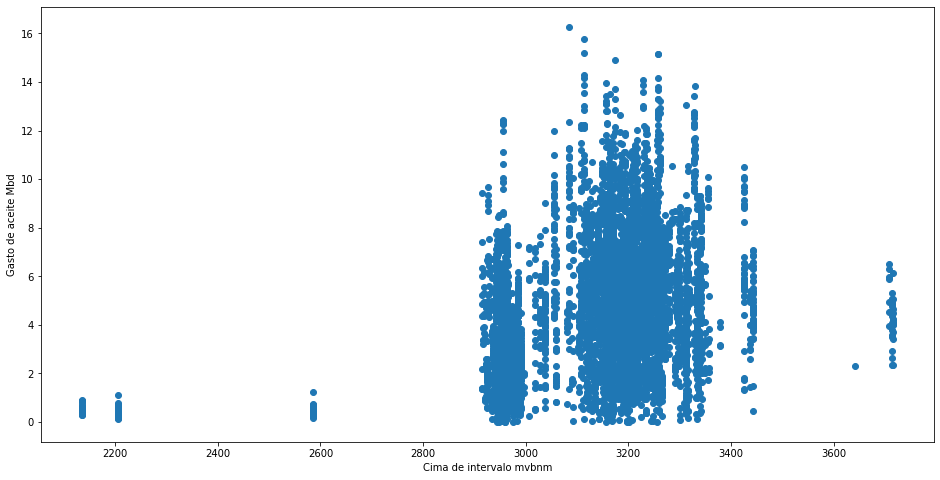

In [8]:
%time 

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['cima_intervalo_mvbnm'],df['gasto_aceite_Mbd'])
ax.set_xlabel('Cima de intervalo mvbnm')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()

Wall time: 0 ns


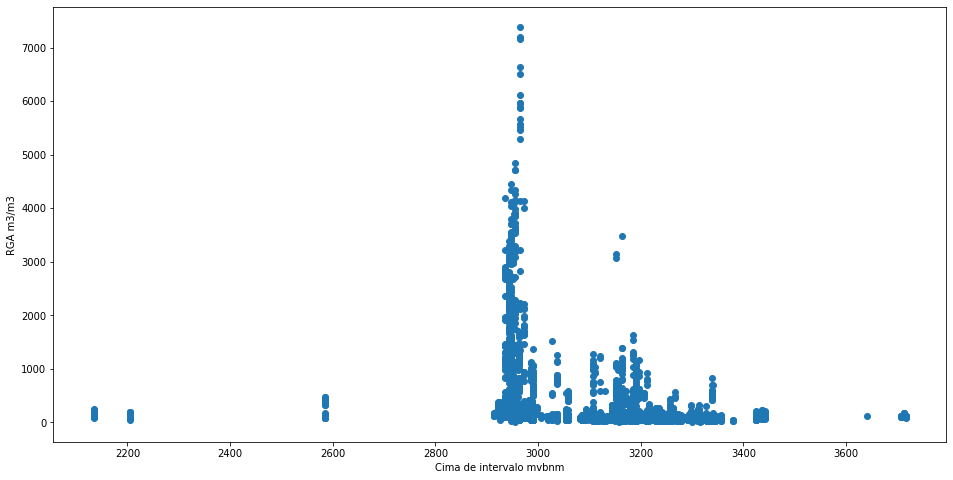

In [9]:
%time 

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['cima_intervalo_mvbnm'],df['RGA_m3/m3'] )
ax.set_xlabel('Cima de intervalo mvbnm')
ax.set_ylabel('RGA m3/m3')
plt.show()

In [10]:
df.columns

Index(['Unnamed: 0', 'fecha', 'campo', 'yacimiento', 'plataforma', 'pozo', 'inicio_produccion_aceite', 'ultima_produccion_aceite', 'gasto_aceite_Mbd', 'gasto_agua_Mbd', 'gasto_gas_MMpcd', 'gasto_gas_BN_MMpcd', 'RGA_m3/m3', 'aceite_acumulado_MMb', 'agua_acumulada_MMb', 'gas_acumulado_MMMpc', 'cima_intervalo_mvbnm', 'base_intervalo_mvbnm', 'distancia_superior_intervalo_a_contacto_gas-aceite_(m)', 'fluyente_BEC_o _BN', 'RGA_pc/bl', 'nivel_CGA', 'cima_mv -nivel_CGA', 'estatus', 'arriba_abajo_CGA', 'campo_yacimiento', 'first_oil', 'Dias Produciendo', 'days_online', 'Exponential_Predicted', 'Hyperbolic_Predicted', 'Harmonic_Predicted'], dtype='object')

In [11]:
to_plot=pd.DataFrame(df,columns=['fecha', 
                                 'campo',
                                 'pozo', 
                                 'gasto_aceite_Mbd',
                                 'gasto_agua_Mbd',
                                 'gasto_gas_MMpcd',
                                 'gasto_gas_BN_MMpcd',
                                 'RGA_m3/m3',
                                 'aceite_acumulado_MMb', 
                                 'agua_acumulada_MMb',
                                 'gas_acumulado_MMMpc',
                                 'cima_intervalo_mvbnm',
                                 'base_intervalo_mvbnm',
                                 'days_online', 
                                 'Exponential_Predicted', 
                                 'Hyperbolic_Predicted', 
                                 'Harmonic_Predicted'])

In [12]:
to_plot2=pd.DataFrame(df,columns=['fecha', 
                                 'campo',
                                 'pozo', 
                                 'gasto_aceite_Mbd',
                                 'gasto_agua_Mbd',
                                 'gasto_gas_MMpcd',
                                 'gasto_gas_BN_MMpcd',
                                 'days_online',
                                 'RGA_m3/m3',])

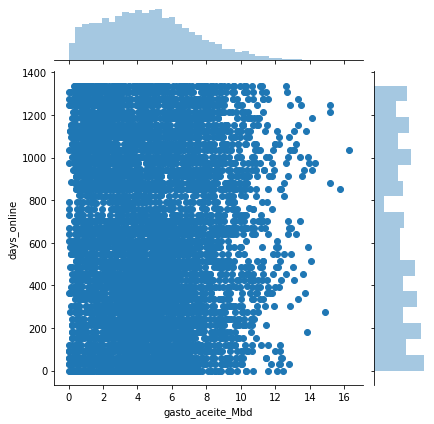

In [13]:
sns.jointplot(to_plot2.gasto_aceite_Mbd,to_plot2.days_online)

C:\Users\elias\Anaconda\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\elias\Anaconda\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


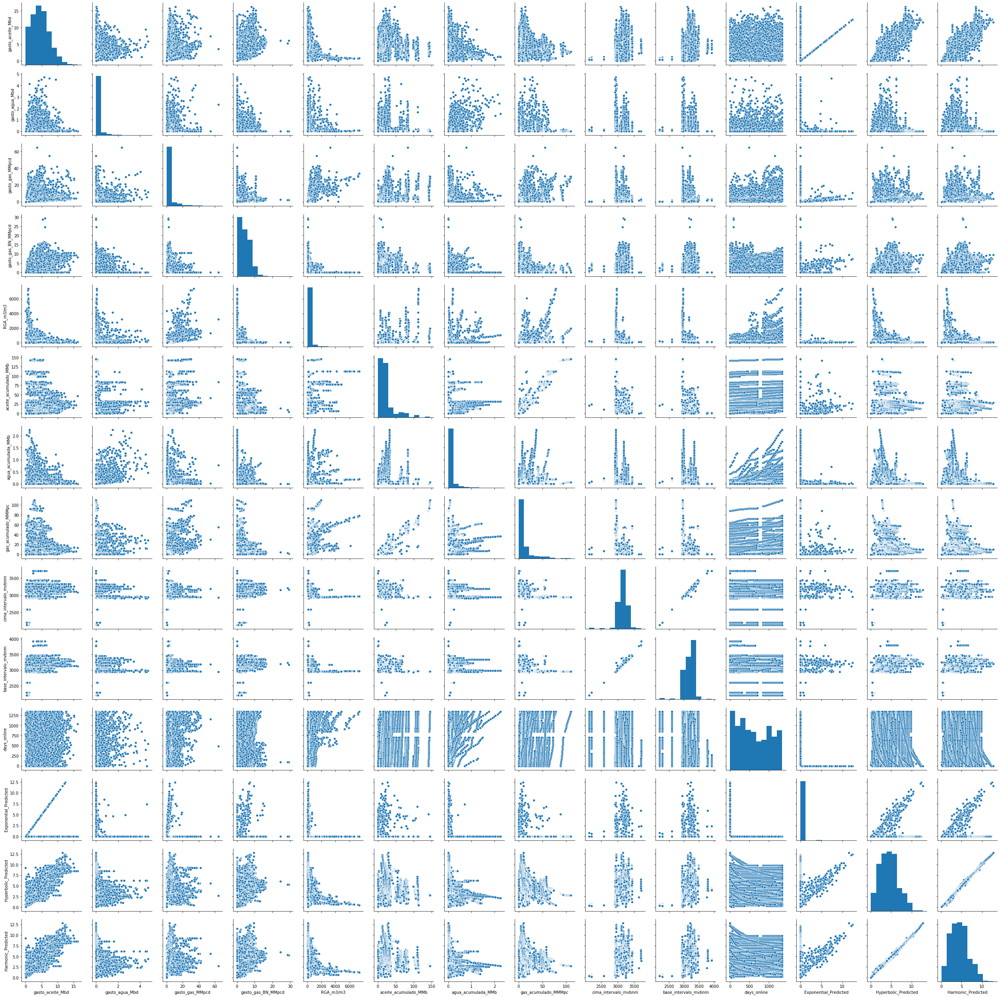

In [14]:
sns.pairplot(to_plot)

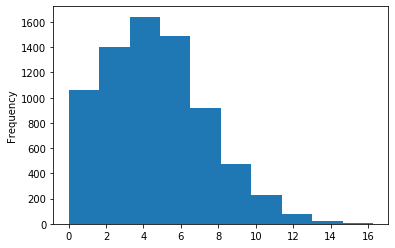

In [15]:
df.gasto_aceite_Mbd.plot.hist()

In [16]:
display(df.head(),df.shape)
unique_well_list=pd.unique(list(df.pozo))
display(unique_well_list.shape, len(unique_well_list))

,Unnamed: 0,fecha,campo,yacimiento,plataforma,pozo,inicio_produccion_aceite,ultima_produccion_aceite,gasto_aceite_Mbd,gasto_agua_Mbd,gasto_gas_MMpcd,gasto_gas_BN_MMpcd,RGA_m3/m3,aceite_acumulado_MMb,agua_acumulada_MMb,gas_acumulado_MMMpc,cima_intervalo_mvbnm,base_intervalo_mvbnm,distancia_superior_intervalo_a_contacto_gas-aceite_(m),fluyente_BEC_o _BN,RGA_pc/bl,nivel_CGA,cima_mv -nivel_CGA,estatus,arriba_abajo_CGA,campo_yacimiento,first_oil,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted
0,0,2016-01-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/01/16,1.22,0.01,2.30,1.79,nan,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,889.96",2919.2,-334.2,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,0,0,1.22,0.60,0.61
1,178,2016-02-29,KU,KU_CCE,KU-A,KU-10,02/28/86,29/02/16,0.15,0.01,0.28,0.40,331.05,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,858.69",2924.518217,-339.518217,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,29,29,0.00,0.60,0.60
2,357,2016-03-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/03/16,0.44,0.10,0.90,2.05,367.06,9.94,0.14,5.90,"2,585.00","2,603.00",-,BN,"2,060.87",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,60,60,0.00,0.59,0.59
3,538,2016-04-30,KU,KU_CCE,KU-A,KU-10,02/28/86,30/04/16,0.44,0.03,0.97,1.81,389.10,9.96,0.14,5.93,"2,585.00","2,603.00",-,BN,"2,184.62",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,90,90,0.00,0.59,0.59
4,719,2016-05-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/05/16,0.45,0.07,0.98,2.61,388.96,9.97,0.14,5.96,"2,585.00","2,603.00",-,BN,"2,183.85",2923.5,-338.5,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,121,121,0.00,0.58,0.58


(7328, 32)

(222,)

222

count   7,328.00
mean        4.66
std         2.72
min         0.00
25%         2.57
50%         4.46
75%         6.37
max        16.27
Name: gasto_aceite_Mbd, dtype: float64

0.10   1.20
0.50   4.46
0.90   8.36
Name: gasto_aceite_Mbd, dtype: float64

count   7,328.00
mean        4.45
std         2.23
min         0.03
25%         2.77
50%         4.30
75%         5.74
max        12.80
Name: Hyperbolic_Predicted, dtype: float64

0.10   1.70
0.50   4.30
0.90   7.53
Name: Hyperbolic_Predicted, dtype: float64

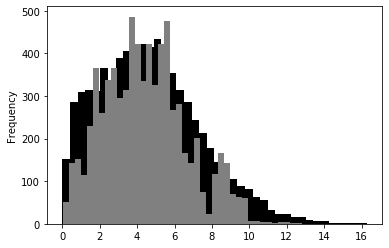

In [17]:
display(df.gasto_aceite_Mbd.describe(),
        df.gasto_aceite_Mbd.quantile([.1,.5,.9]),
        df.Hyperbolic_Predicted.describe(),
        df.Hyperbolic_Predicted.quantile([.1,.5,.9]))
df.gasto_aceite_Mbd.plot.hist(bins=40,color='black'),
df.Hyperbolic_Predicted.plot.hist(bins=40,color='gray')

count   7,328.00
mean        3.66
std         5.25
min         0.00
25%         1.24
50%         2.12
75%         3.52
max        64.57
Name: gasto_gas_MMpcd, dtype: float64

0.10   0.65
0.50   2.12
0.90   7.48
Name: gasto_gas_MMpcd, dtype: float64

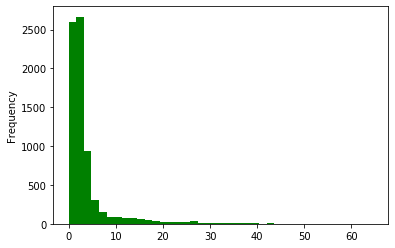

In [18]:
display(df.gasto_gas_MMpcd.describe(),
       df.gasto_gas_MMpcd.quantile([.1,.5,.9]))
df.gasto_gas_MMpcd.plot.hist(bins=40,color='green')

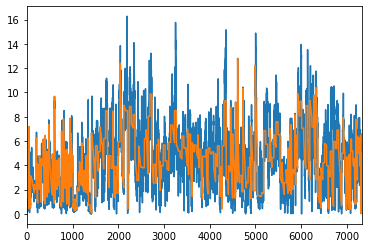

In [19]:
df.gasto_aceite_Mbd.plot()
df.Hyperbolic_Predicted.plot()

In [20]:
class Distribution(object):
    
    def __init__(self,dist_names_list = []):
        self.dist_names = ['beta',
                            'expon',
                            'gamma',
                            'lognorm',
                            'norm',
                            'pearson3',
                            'triang',
                            'uniform',
                            'weibull_min', 
                            'weibull_max']
        self.dist_results = []
        self.params = {}
        
        self.DistributionName = ""
        self.PValue = 0
        self.Param = None
        
        self.isFitted = False
        
        
    def Fit(self, y):
        self.dist_results = []
        self.params = {}
        for dist_name in self.dist_names:
            dist = getattr(scipy.stats, dist_name)
            param = dist.fit(y)
            
            self.params[dist_name] = param
            #Applying the Kolmogorov-Smirnov test
            D, p = scipy.stats.kstest(y, dist_name, args=param);
            self.dist_results.append((dist_name,p))
        #select the best fitted distribution
        sel_dist,p = (max(self.dist_results,key=lambda item:item[1]))
        #store the name of the best fit and its p value
        self.DistributionName = sel_dist
        self.PValue = p
        
        self.isFitted = True
        return self.DistributionName,self.PValue
    
    def Random(self, n = 1):
        if self.isFitted:
            dist_name = self.DistributionName
            param = self.params[dist_name]
            #initiate the scipy distribution
            dist = getattr(scipy.stats, dist_name)
            return dist.rvs(*param[:-2], loc=param[-2], scale=param[-1], size=n)
        else:
            raise ValueError('Must first run the Fit method.')
            
    def Plot(self,y):
        x = self.Random(n=len(y))
        fig, ax = plt.subplots(figsize=(16,8))
        plt.hist(x, alpha=0.5, label='Fitted',bins=50)
        plt.hist(y, alpha=0.5, label='Actual',bins=50)
        plt.legend(loc='upper right')

# Estadística CAMPOS

In [21]:
import timeit
tic=timeit.default_timer()

mx_stats=pd.read_csv(r'C:/Users/elias/Google Drive//python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                    low_memory=False)

display(mx_stats.shape)

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

(2838332, 10)

11.281663900000012

In [22]:
input_campo = input("Nombre de Campo: ")

Nombre de Campo: ARENQUE


In [23]:
import timeit
tic=timeit.default_timer()

selected_rows=mx_stats.pozo.str.contains(str(input_campo))
campo=mx_stats.loc[selected_rows]

unique_well_list=pd.unique(campo['pozo'])

display('Número de pozos en:',
        input_campo,
        len(unique_well_list),
        unique_well_list,
        campo.shape)


toc=timeit.default_timer()
toc - tic #elapsed time in seconds

'Número de pozos en:'

'ARENQUE'

30

array(['ARENQUE-101', 'ARENQUE-103', 'ARENQUE-12', 'ARENQUE-18',
       'ARENQUE-23', 'ARENQUE-26', 'ARENQUE-30', 'ARENQUE-31',
       'ARENQUE-37', 'ARENQUE-41', 'ARENQUE-42', 'ARENQUE-46',
       'ARENQUE-58', 'ARENQUE-6', 'ARENQUE-24', 'ARENQUE-20',
       'ARENQUE-54', 'ARENQUE-5', 'ARENQUE-13A', 'ARENQUE-16',
       'ARENQUE-15', 'ARENQUE-22', 'ARENQUE-17', 'ARENQUE-10',
       'ARENQUE-28', 'ARENQUE-104', 'ARENQUE-48', 'ARENQUE-50',
       'ARENQUE-33', 'ARENQUE-56'], dtype=object)

(9809, 10)

1.992055300000004

In [24]:
import timeit
tic=timeit.default_timer()

display(campo.aceite_Mbd.quantile([.1,.5,.9]))
display(campo.describe())

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

0.10   0.08
0.50   0.30
0.90   1.08
Name: aceite_Mbd, dtype: float64

,Unnamed: 0,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"9,809.00","9,809.00","9,809.00","9,809.00","9,809.00","9,809.00"
mean,"412,593.21",0.51,0.09,0.00,1.44,0.00
std,"237,992.65",0.64,0.16,0.00,1.63,0.03
min,"1,366.00",0.00,0.00,0.00,0.00,0.00
25%,"208,647.00",0.15,0.00,0.00,0.26,0.00
50%,"354,222.00",0.30,0.02,0.00,0.75,0.00
75%,"592,707.00",0.64,0.11,0.00,2.20,0.00
max,"997,317.00",6.59,1.28,0.00,10.63,0.66


0.11971719999999664

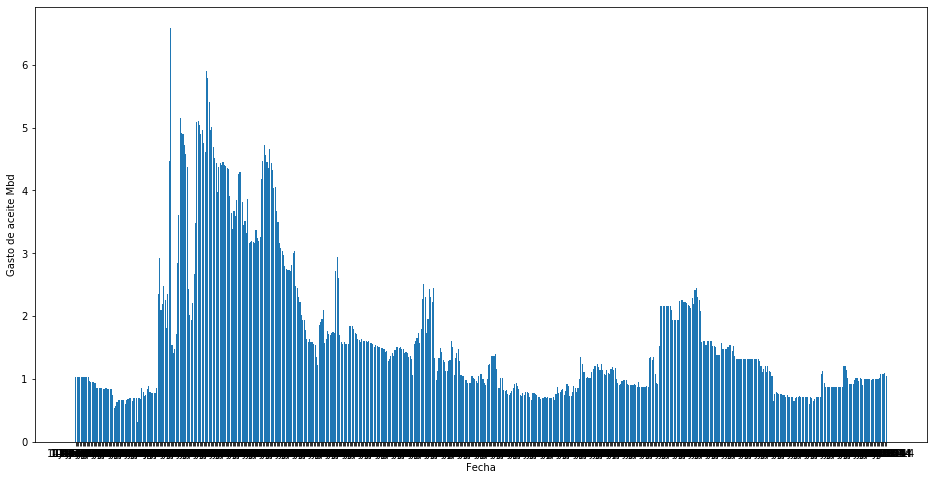

39.498856200000006

In [25]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(campo.fecha,campo.aceite_Mbd)
ax.set_xlabel('Fecha')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

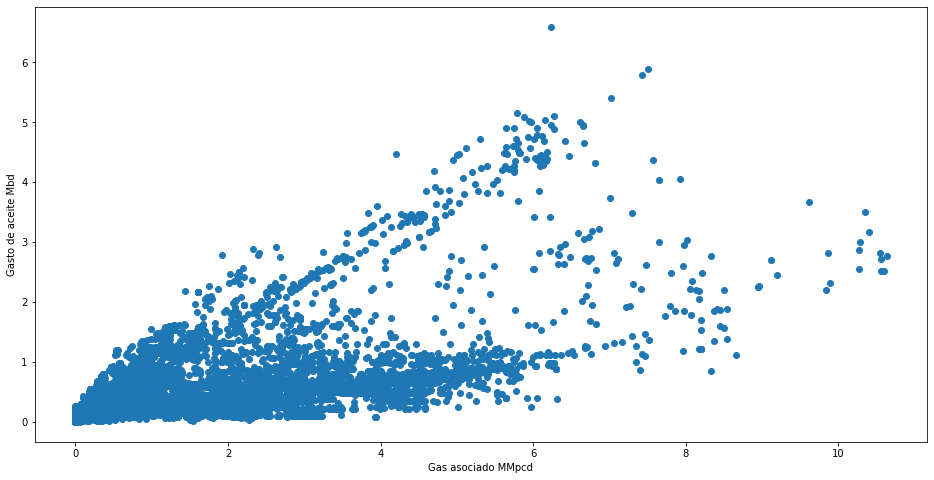

0.4187249999999949

In [26]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(campo.gas_asociado_MMpcd,campo.aceite_Mbd)
ax.set_xlabel('Gas asociado MMpcd')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()


toc=timeit.default_timer()
toc - tic #elapsed time in seconds

0.0655435999999554

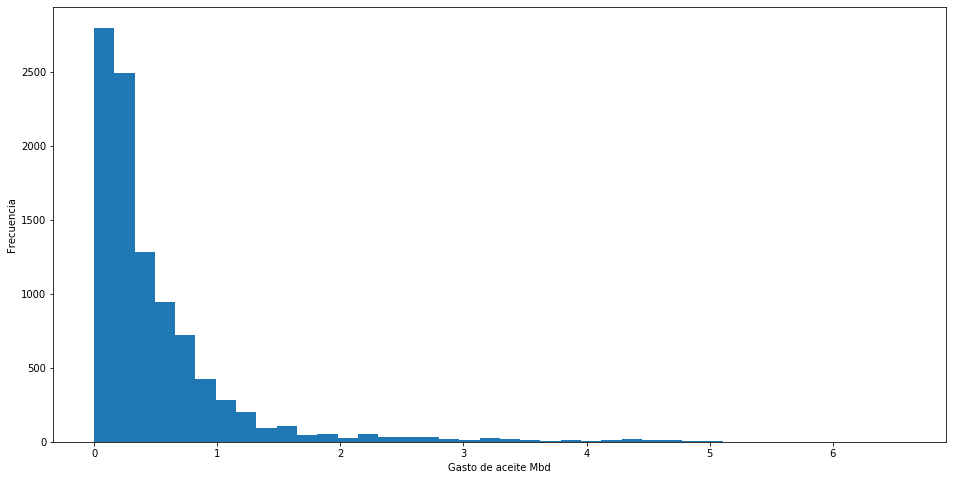

In [27]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.hist(campo.aceite_Mbd,
        bins=40,
        cumulative=False,
        density=False)
ax.set_xlabel('Gasto de aceite Mbd')
ax.set_ylabel('Frecuencia')

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

C:\Users\elias\Anaconda\lib\site-packages\scipy\stats\_continuous_distns.py:515: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


('lognorm', 5.292794053299753e-05)

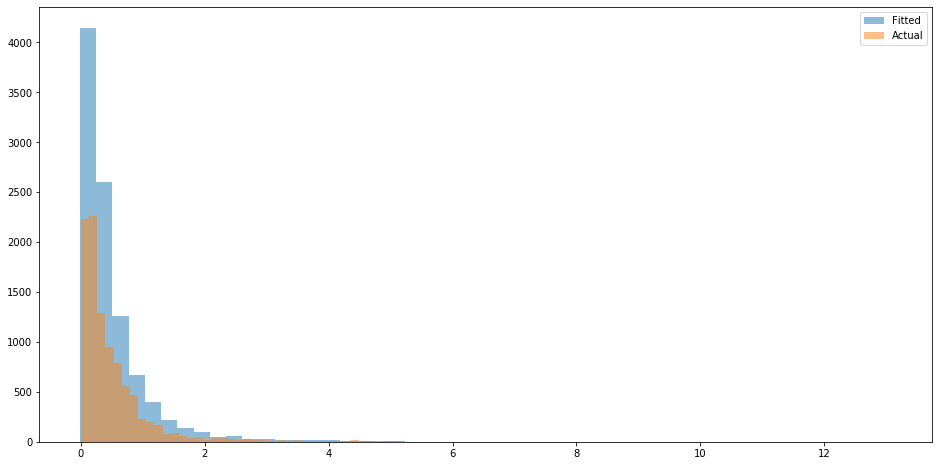

In [28]:
dst=Distribution()
display(dst.Fit(campo.aceite_Mbd))
dst.Plot(campo.aceite_Mbd)

## Q inicial

In [29]:
def get_max_initial_production(df, variable_column, well_column, date_column):
    global df_beginning_production
    global field
    """
    This function allows you to look at the first X months of production, and selects 
    the highest production month as max initial production
    Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
    """
    #First, sort the data frame from earliest to most recent prod date
    field=campo.sort_values(by=[date_column,well_column])
    num_months=int((len(field))*.20)
    #Pull out the first x months of production, where number_first_months is x
    df_beginning_production=field.head(num_months)
    #Return the max value in the selected variable column from the newly created 
    #df_beginning_production df
    return df_beginning_production[variable_column].max(), num_months, field.shape

In [30]:
get_max_initial_production(campo,'aceite_Mbd','pozo','fecha')

(5.0410650000000015, 1961, (9809, 10))

In [31]:
df_beginning_production.shape

(1961, 10)

In [32]:
for unique_well_list in field:
    display(get_max_initial_production)

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

# Función Estadística Campos

In [35]:
def estadistica_campo():
    global campo
    global unique_well_list
    global input_campo
    
    tic=timeit.default_timer()
    
    mx_stats=pd.read_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                         index_col=0,
                        low_memory=False)
    
    display('Numero de datos en base: '+str(len(mx_stats)))

    display(mx_stats.shape)
    
    input_campo = input("Nombre de Campo: ")
    
    selected_rows=mx_stats.pozo.str.contains(str(input_campo))
    campo=mx_stats.loc[selected_rows]

    display(campo.head(),campo.shape)
    
    unique_well_list=pd.unique(campo['pozo'])

    display('Número de pozos en:',
            input_campo,
            len(unique_well_list),
            unique_well_list,
            campo.shape)

    display(campo.aceite_Mbd.quantile([.1,.5,.9]),
            campo.describe())

    #fig1, ax1 = plt.subplots(figsize=(16,8))
    #ax1.bar(campo.fecha,campo.aceite_Mbd)
    #ax1.set_xlabel('Fecha')
    #ax1.set_ylabel('Gasto de aceite Mbd')
    #plt.show()

    #fig2, ax2 = plt.subplots(figsize=(16,8))
    #ax2.scatter(campo.fecha,campo.aceite_Mbd)
    #ax2.set_xlabel('Fecha')
    #ax2.set_ylabel('Gasto de aceite Mbd')
    #plt.show()

    #fig3, ax3 = plt.subplots(figsize=(16,8))
    #ax3.hist(campo.aceite_Mbd,
            #bins=40,
            #cumulative=False,
            #density=False)
    #ax3.set_xlabel('Gasto de aceite Mbd')
    #ax3.set_ylabel('Frecuencia')
    

    dst=Distribution()
    display(dst.Fit(campo.aceite_Mbd))
    dst.Plot(campo.aceite_Mbd)
    
    campo.to_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/'+str(input_campo)+str('.csv'))
    
    toc=timeit.default_timer()
    tac= toc - tic #elapsed time in seconds
    
    return display('Tiempo de procesamiento: ' +str(tac))

C:\Users\elias\Anaconda\lib\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


'Numero de datos en base: 2838332'

(2838332, 9)

Nombre de Campo: ZAAP


,aceite_Mbd,agua_Mbd,asignacion,condensado_Mbd,cuenca,fecha,gas_asociado_MMpcd,gas_no_asociado_MMpcd,pozo
247631,0.52,0.00,NaN,0.00,Cuencas del Sureste,1-Nov-1992,0.23,0.00,ZAAP-2051
248620,1.37,0.00,NaN,0.00,Cuencas del Sureste,1-Dec-1992,0.62,0.00,ZAAP-2051
250635,2.73,0.00,NaN,0.00,Cuencas del Sureste,1-Feb-1993,1.23,0.00,ZAAP-2032
250636,0.08,0.00,NaN,0.00,Cuencas del Sureste,1-Feb-1993,0.04,0.00,ZAAP-2051
251646,2.76,0.00,NaN,0.00,Cuencas del Sureste,1-Mar-1993,1.24,0.00,ZAAP-2032


(8660, 9)

'Número de pozos en:'

'ZAAP'

81

array(['ZAAP-2051', 'ZAAP-2032', 'ZAAP-3D', 'ZAAP-5D', 'ZAAP-1001',
       'ZAAP-106', 'ZAAP-7DA', 'ZAAP-27D', 'ZAAP-22D', 'ZAAP-95',
       'ZAAP-108', 'ZAAP-23D', 'ZAAP-2031', 'ZAAP-20', 'ZAAP-36',
       'ZAAP-25D', 'ZAAP-18', 'ZAAP-24', 'ZAAP-38', 'ZAAP-4', 'ZAAP-48',
       'ZAAP-10', 'ZAAP-12', 'ZAAP-26', 'ZAAP-16', 'ZAAP-32', 'ZAAP-128',
       'ZAAP-22', 'ZAAP-25', 'ZAAP-27', 'ZAAP-8', 'ZAAP-2', 'ZAAP-58',
       'ZAAP-14', 'ZAAP-28', 'ZAAP-30', 'ZAAP-41', 'ZAAP-9', 'ZAAP-6D',
       'ZAAP-43', 'ZAAP-118', 'ZAAP-6', 'ZAAP-44', 'ZAAP-1003', 'ZAAP-11',
       'ZAAP-5', 'ZAAP-210', 'ZAAP-111', 'ZAAP-208', 'ZAAP-21',
       'ZAAP-110D', 'ZAAP-29D', 'ZAAP-114D', 'ZAAP-103', 'ZAAP-31D',
       'ZAAP-15', 'ZAAP-33D', 'ZAAP-116D', 'ZAAP-50', 'ZAAP-34',
       'ZAAP-35', 'ZAAP-126', 'ZAAP-19', 'ZAAP-46D', 'ZAAP-51', 'ZAAP-90',
       'ZAAP-52', 'ZAAP-54', 'ZAAP-68', 'ZAAP-42', 'ZAAP-62', 'ZAAP-78',
       'ZAAP-72DES', 'ZAAP-56DES', 'ZAAP-66DES', 'ZAAP-53DES',
       'ZAAP-115DES', 'ZAA

(8660, 9)

0.10   1.78
0.50   5.21
0.90   9.03
Name: aceite_Mbd, dtype: float64

,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"8,660.00","8,660.00","8,660.00","8,660.00","8,660.00"
mean,5.39,0.02,0.00,2.59,0.00
std,2.90,0.13,0.00,3.47,0.00
min,0.00,0.00,0.00,0.00,0.00
25%,3.24,0.00,0.00,1.09,0.00
50%,5.21,0.00,0.00,1.84,0.00
75%,7.25,0.00,0.00,2.82,0.00
max,17.01,2.57,0.00,53.74,0.00


('weibull_min', 0.001444128327957998)

'Tiempo de procesamiento: 25.926213800000028'

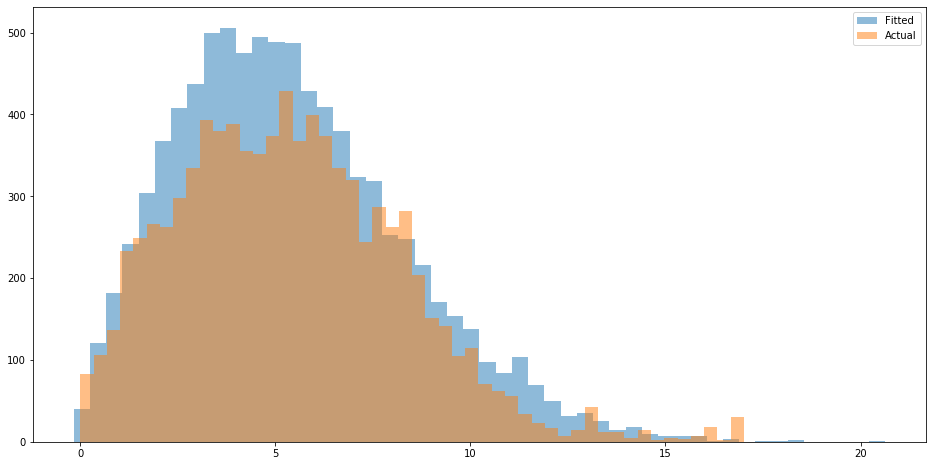

In [36]:
estadistica_campo()

# DCA

Exponential Fit Curve-fitted Variables: qi=0.0521445, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.012560720554538624, b=1.9999999999999998, di=8.433115180547636e-06
Harmonic Fit Curve-fitted Variables: qi=0.012279511109954861, di=5.334345622717808e-06


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


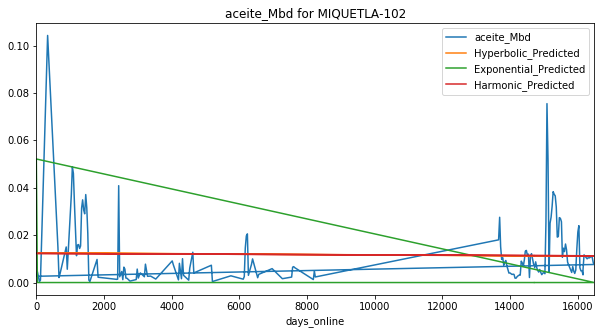

Exponential Fit Curve-fitted Variables: qi=0.068579, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1180125441842558, b=4.077048672890752e-08, di=0.0001516158405946413
Harmonic Fit Curve-fitted Variables: qi=0.12660250897145614, di=0.00039096111715816284


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


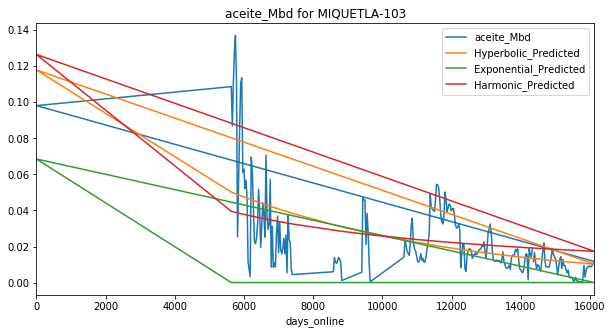

Exponential Fit Curve-fitted Variables: qi=0.044552999999999995, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08885970946618049, b=0.8822765573332321, di=0.0003689337942390605
Harmonic Fit Curve-fitted Variables: qi=0.08910589962250337, di=0.000420474843924792


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


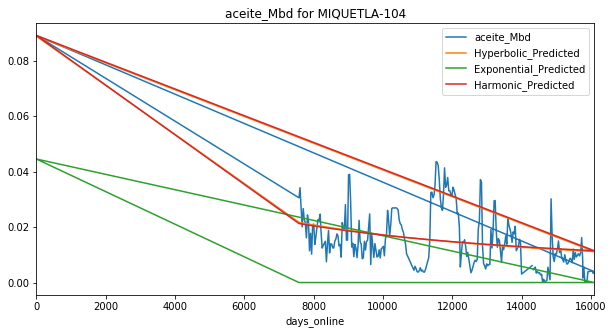

Exponential Fit Curve-fitted Variables: qi=0.0812435, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09864588288029771, b=1.3923080895500148, di=0.0011690280374636447
Harmonic Fit Curve-fitted Variables: qi=0.09753634395856349, di=0.0006677238520662077


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


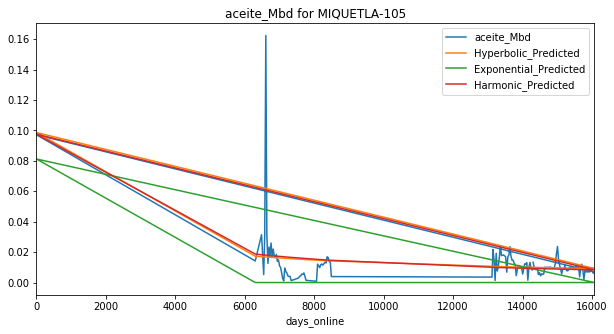

Exponential Fit Curve-fitted Variables: qi=0.044657499999999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08931496527224735, b=1.9999999588112245, di=0.001803966381938973
Harmonic Fit Curve-fitted Variables: qi=0.08632677577896866, di=0.0004926999733330264


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


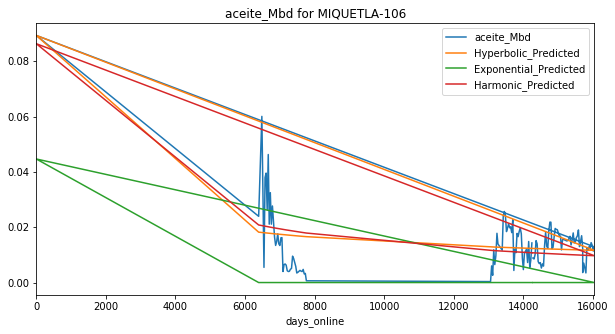

Exponential Fit Curve-fitted Variables: qi=0.067869, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.059729324069114284, b=1.9999999999999998, di=0.0007404893884339821
Harmonic Fit Curve-fitted Variables: qi=0.04296479401991844, di=0.0001739857575392202


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


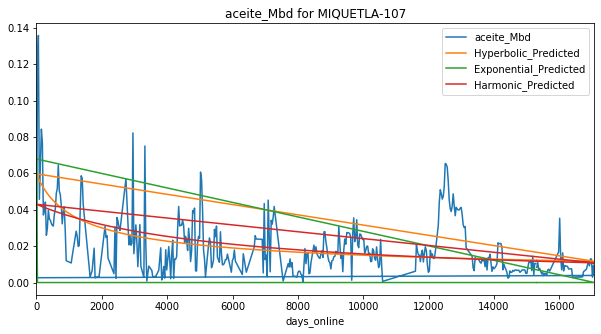

Exponential Fit Curve-fitted Variables: qi=0.0396665, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0440753821608278, b=1.0250915171254804, di=0.0005298353255452751
Harmonic Fit Curve-fitted Variables: qi=0.04394974111995409, di=0.0005189743323679423


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


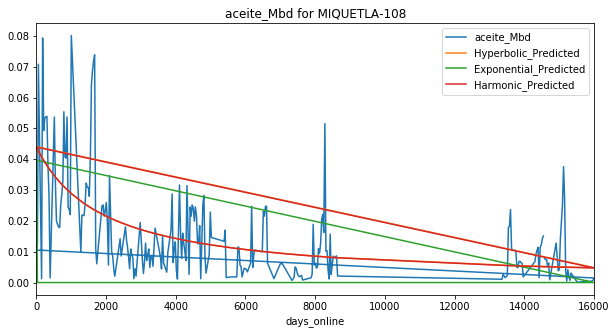

Exponential Fit Curve-fitted Variables: qi=0.046739499999999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09347899999718147, b=1.9999999999995386, di=0.0017916738260854792
Harmonic Fit Curve-fitted Variables: qi=0.08714465086102174, di=0.00044727079571688327


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


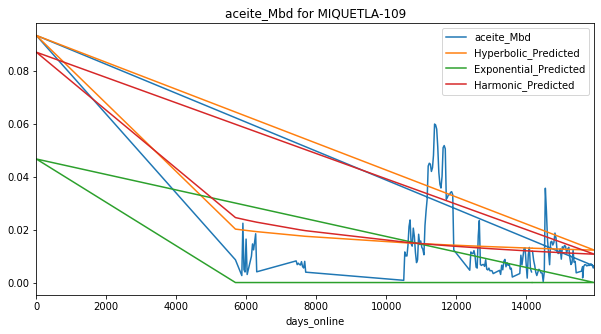

Exponential Fit Curve-fitted Variables: qi=0.0452865, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09057299997726147, b=1.999999999999963, di=0.006831110307905612
Harmonic Fit Curve-fitted Variables: qi=0.017018248686805338, di=4.758498414109543e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


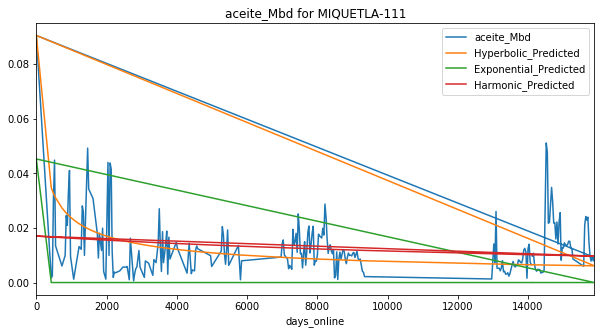

Exponential Fit Curve-fitted Variables: qi=0.058495000000000005, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08445718912122635, b=1.569322465908507, di=0.0018865199146980345
Harmonic Fit Curve-fitted Variables: qi=0.07171367478924853, di=0.0008624234311879325


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


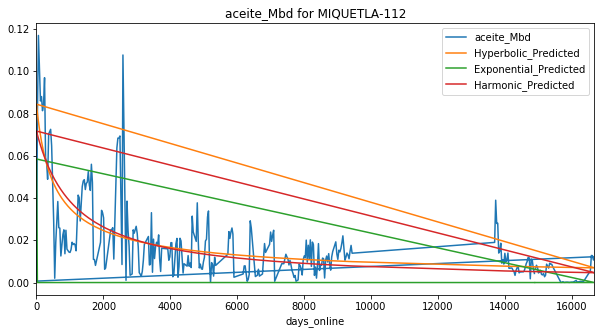

Exponential Fit Curve-fitted Variables: qi=0.0182605, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023863167519459952, b=1.9999999999999991, di=0.0004365415463222524
Harmonic Fit Curve-fitted Variables: qi=0.017332793646087336, di=0.00012057370488766718


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


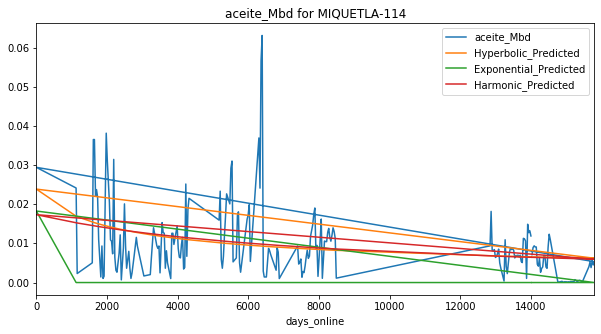

Exponential Fit Curve-fitted Variables: qi=0.0254635, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.018235507194195668, b=8.407875036064525e-07, di=2.639065421027689e-05
Harmonic Fit Curve-fitted Variables: qi=0.018450553954538932, di=3.2395448321607185e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


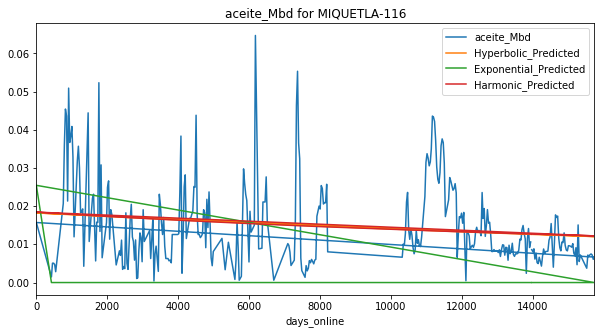

Exponential Fit Curve-fitted Variables: qi=0.028710000000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.057420000000000006, b=1.665830288160745, di=0.002499053718783549
Harmonic Fit Curve-fitted Variables: qi=0.057419726148873654, di=0.0008313637348363477


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


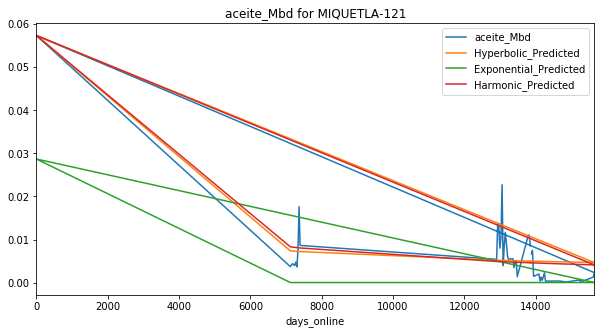

Exponential Fit Curve-fitted Variables: qi=0.043014, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04607384870791894, b=1.9999999999999998, di=0.0001437455223359899
Harmonic Fit Curve-fitted Variables: qi=0.03853122130349909, di=5.521342360679013e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


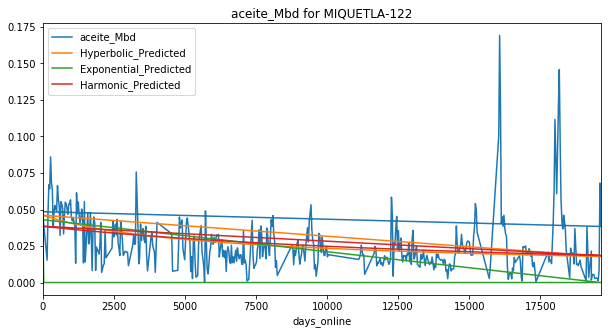

Exponential Fit Curve-fitted Variables: qi=0.026579500000000002, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.036868644709028876, b=1.9426320326196238, di=0.00041075771073563125
Harmonic Fit Curve-fitted Variables: qi=0.03361019787266518, di=0.00019584142388258356


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


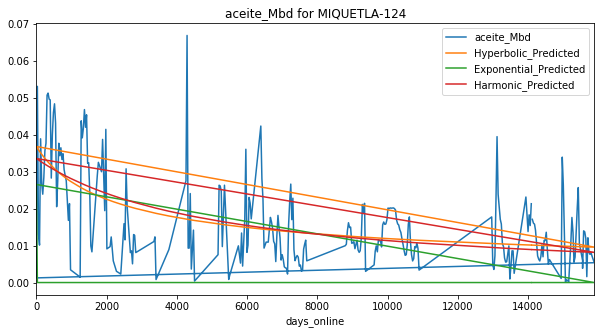

Exponential Fit Curve-fitted Variables: qi=0.08004299999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16008599171974572, b=4.917630500669687e-10, di=0.0002840100749378986
Harmonic Fit Curve-fitted Variables: qi=0.16008599999999873, di=0.0006685513491496665


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


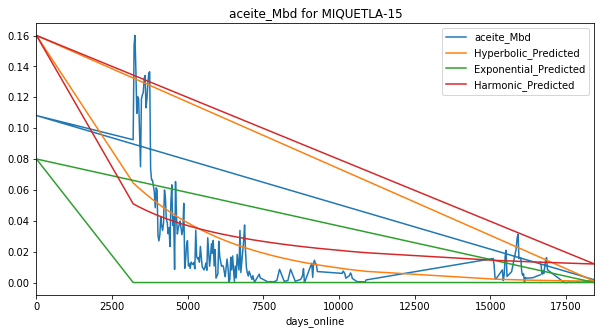

Exponential Fit Curve-fitted Variables: qi=0.032497500000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.060741003333090966, b=1.9999999999999998, di=0.0011935647108950649
Harmonic Fit Curve-fitted Variables: qi=0.016924267788632066, di=1.9464207835532105e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


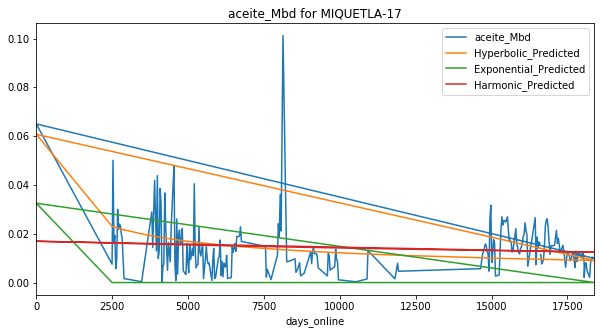

Exponential Fit Curve-fitted Variables: qi=0.1684045, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3355222772875169, b=1.0749477966724312, di=0.001215045060098028
Harmonic Fit Curve-fitted Variables: qi=0.3307344585506886, di=0.0010856607054083962


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


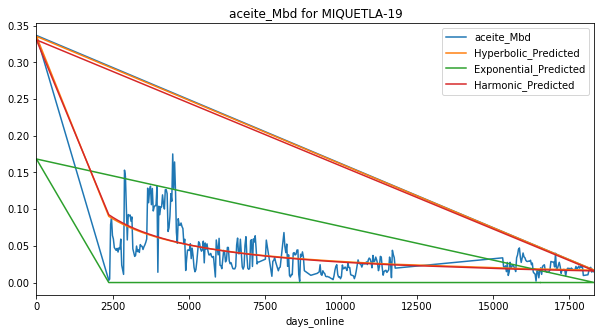

Exponential Fit Curve-fitted Variables: qi=0.0229275, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020532112956096176, b=1.9679582501123632e-05, di=1.551268202638667e-05
Harmonic Fit Curve-fitted Variables: qi=0.02051823359608849, di=1.697708284723296e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


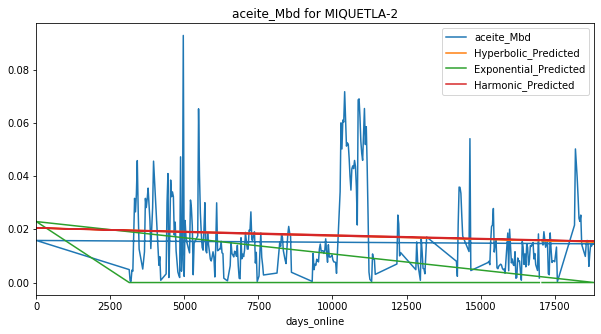

Exponential Fit Curve-fitted Variables: qi=0.11017650000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.220353, b=0.48447207366909145, di=0.0008017149964115774
Harmonic Fit Curve-fitted Variables: qi=0.2203529999999817, di=0.0015153162108325314


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


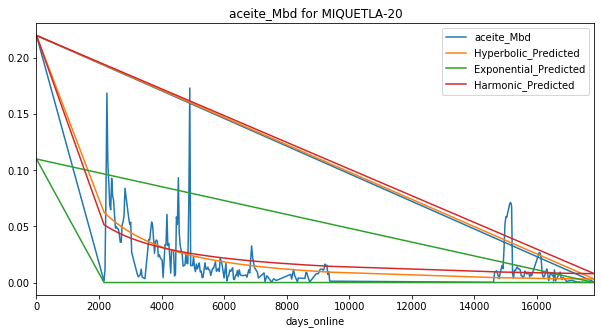

Exponential Fit Curve-fitted Variables: qi=0.188799, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.37759799999999993, b=0.956974501457807, di=0.0024388864498049076
Harmonic Fit Curve-fitted Variables: qi=0.37759799999999993, di=0.002632575390986373


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


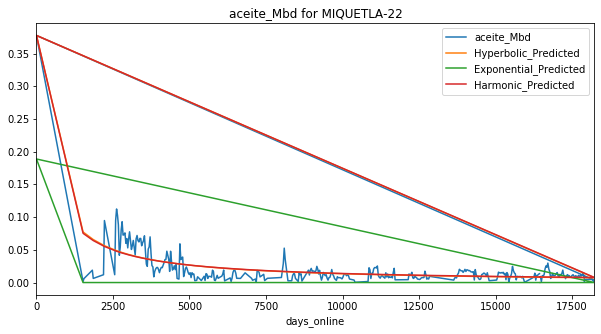

Exponential Fit Curve-fitted Variables: qi=0.146796, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2935919999999641, b=0.8031126677922139, di=0.0013544110217414472
Harmonic Fit Curve-fitted Variables: qi=0.2935919999999857, di=0.0019027648845291113


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


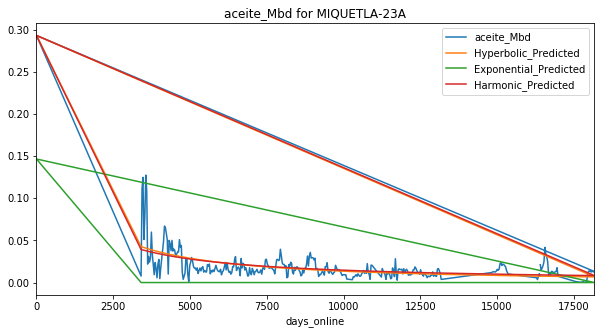

Exponential Fit Curve-fitted Variables: qi=0.085811, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17162199999999986, b=1.9999999999999982, di=0.010850872519687785
Harmonic Fit Curve-fitted Variables: qi=0.16788528022621238, di=0.0019533845746063706


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


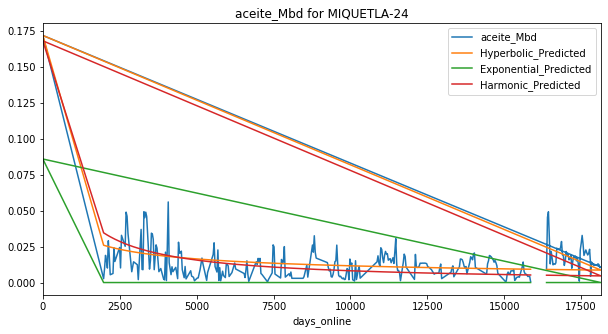

Exponential Fit Curve-fitted Variables: qi=0.1569305, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3138609999999972, b=1.999999999999998, di=0.0043828777335720845
Harmonic Fit Curve-fitted Variables: qi=0.3130705950654816, di=0.0007583713256145527


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


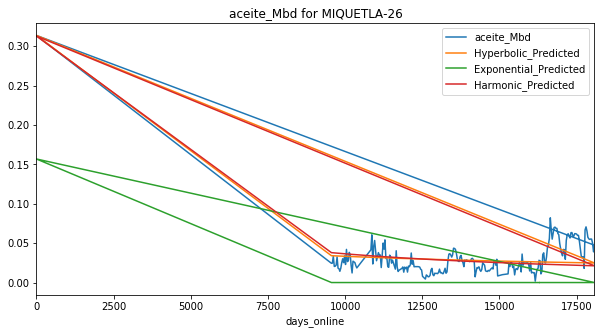

Exponential Fit Curve-fitted Variables: qi=0.180578, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.36115599999965287, b=0.8849967776458101, di=0.0008952214976853054
Harmonic Fit Curve-fitted Variables: qi=0.3611559961308156, di=0.0011124472758508985


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


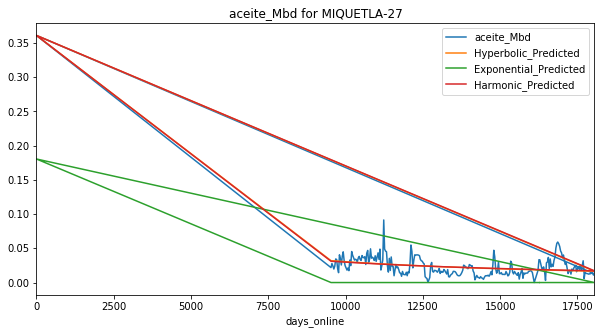

Exponential Fit Curve-fitted Variables: qi=0.11122449999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.222448999999388, b=1.683498899487372, di=0.001404650096118107
Harmonic Fit Curve-fitted Variables: qi=0.22244899999999995, di=0.0005268477138427174


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


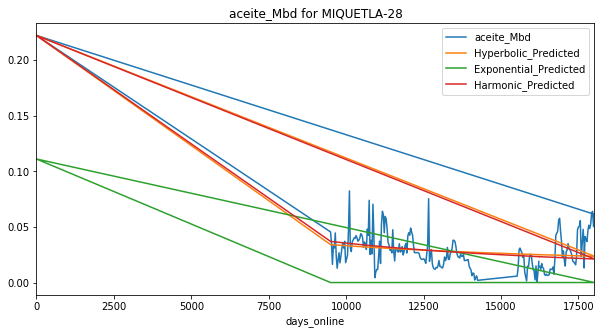

Exponential Fit Curve-fitted Variables: qi=0.12873800000000002, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25747599999999793, b=1.8612986371882931, di=0.009584658058430494
Harmonic Fit Curve-fitted Variables: qi=0.2565680797692727, di=0.00222239208309039


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


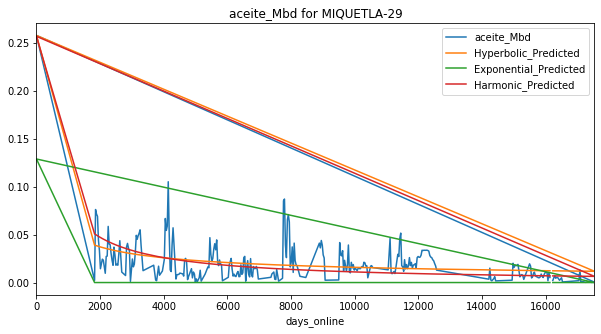

Exponential Fit Curve-fitted Variables: qi=0.107346, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21469199450968907, b=1.2526191064549004, di=0.0013499274089792907
Harmonic Fit Curve-fitted Variables: qi=0.20382328563429364, di=0.0008959166505404534


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


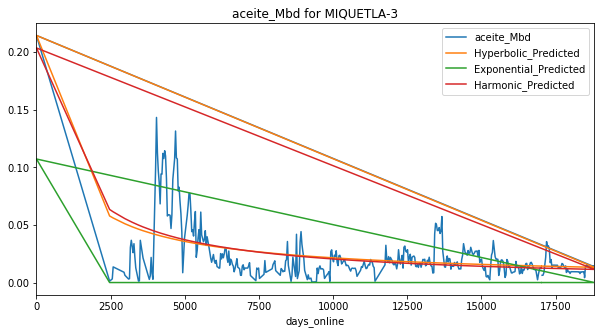

Exponential Fit Curve-fitted Variables: qi=0.0175085, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025572022934092876, b=1.9999999999999998, di=0.0014093585604745512
Harmonic Fit Curve-fitted Variables: qi=0.022177582165116384, di=0.0006221806138489749


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


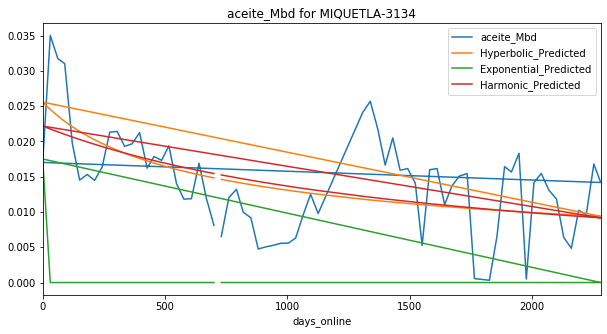

Exponential Fit Curve-fitted Variables: qi=0.1604915, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.32098299982995643, b=1.6779590522702106, di=0.006259275920900702
Harmonic Fit Curve-fitted Variables: qi=0.3209829999999524, di=0.001428144812299413


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


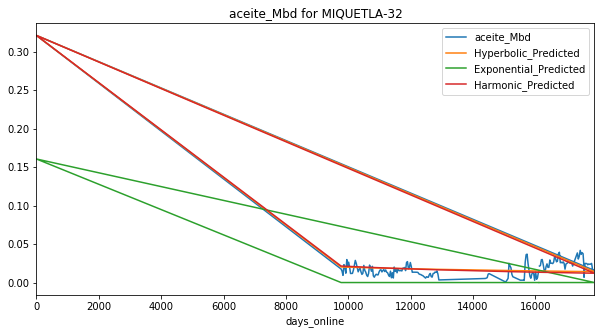

Exponential Fit Curve-fitted Variables: qi=0.13869, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.27737999999999996, b=7.943810972333268e-10, di=0.0004069540564631749
Harmonic Fit Curve-fitted Variables: qi=0.2773799999999748, di=0.0013372302016955778


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


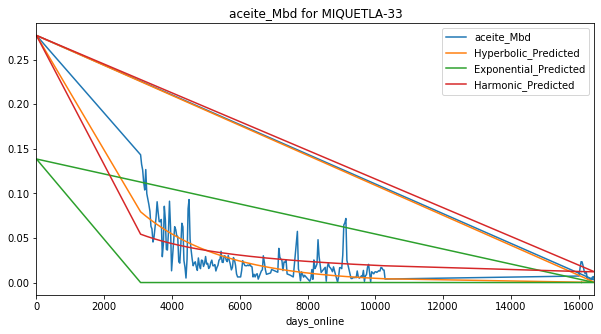

Exponential Fit Curve-fitted Variables: qi=0.016281, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019359704289374943, b=1.9999999999999998, di=0.000433619415252657
Harmonic Fit Curve-fitted Variables: qi=0.017049216663301142, di=0.00019317079599468517


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


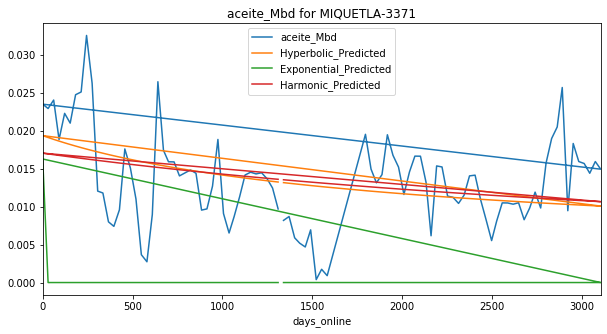

Exponential Fit Curve-fitted Variables: qi=0.1460855, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.29217099999999996, b=1.1039167066187672, di=0.0015664675894264783
Harmonic Fit Curve-fitted Variables: qi=0.29032477196954426, di=0.0013775263265156735


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


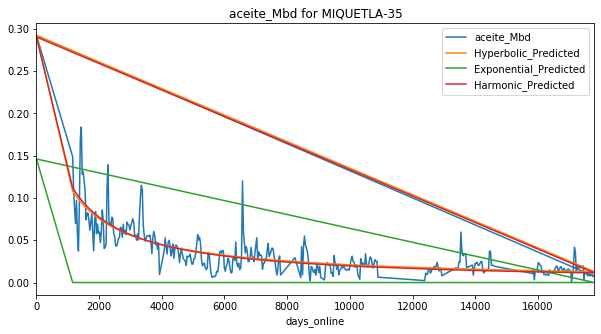

Exponential Fit Curve-fitted Variables: qi=0.010034, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.01642717097885496, b=6.031098131395849e-10, di=0.00010664416035454083
Harmonic Fit Curve-fitted Variables: qi=0.0162367029465755, di=0.00010580788243842712


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


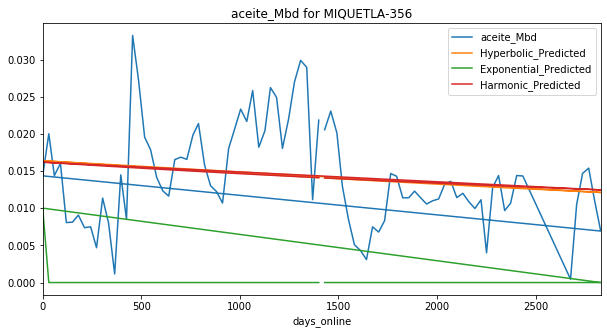

Exponential Fit Curve-fitted Variables: qi=0.133209, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2664179999999965, b=1.6241963540581132, di=0.0036727256660328516
Harmonic Fit Curve-fitted Variables: qi=0.258212068634936, di=0.0013242754984509933


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


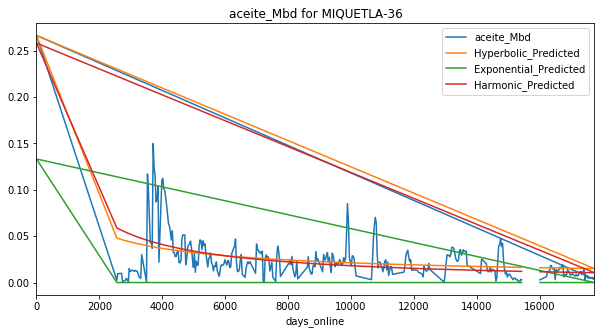

Exponential Fit Curve-fitted Variables: qi=0.1937665, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.38753299999999996, b=1.4254954505447162, di=0.006335206238118511
Harmonic Fit Curve-fitted Variables: qi=0.38753299999999996, di=0.002393590525299493


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


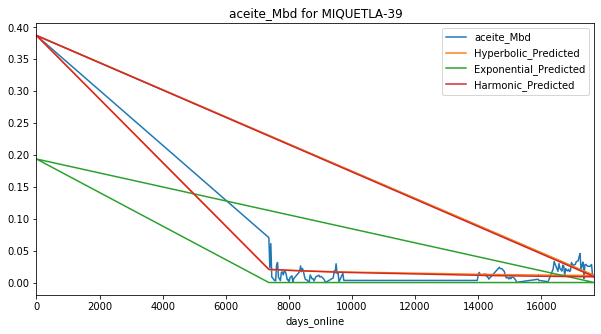

Exponential Fit Curve-fitted Variables: qi=0.129854, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25970799999999983, b=0.4387977558426742, di=0.0008297177766620966
Harmonic Fit Curve-fitted Variables: qi=0.25970799999998384, di=0.002027134971189772


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


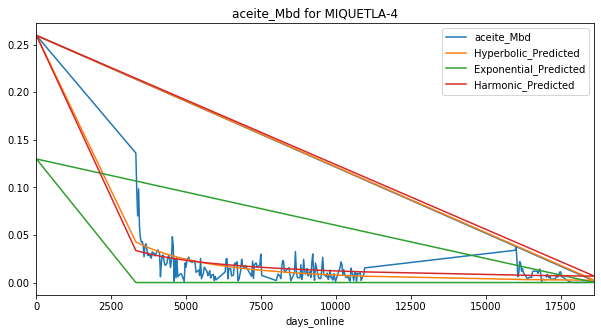

Exponential Fit Curve-fitted Variables: qi=0.09350850000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.187017, b=1.8851042538674703, di=0.006383666042105243
Harmonic Fit Curve-fitted Variables: qi=0.18701699984935974, di=0.0010924096114385809


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


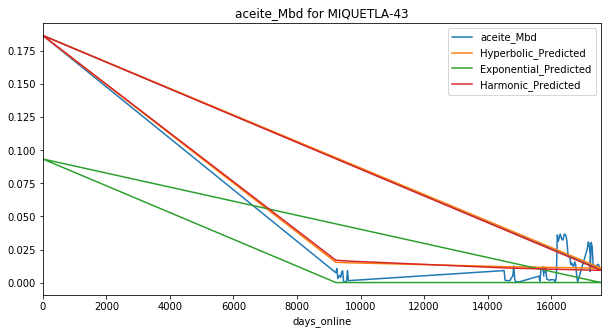

Exponential Fit Curve-fitted Variables: qi=0.09801599999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19603199999984036, b=0.5668528615539044, di=0.0006886794915749937
Harmonic Fit Curve-fitted Variables: qi=0.19603199999999057, di=0.0011994004229786952


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


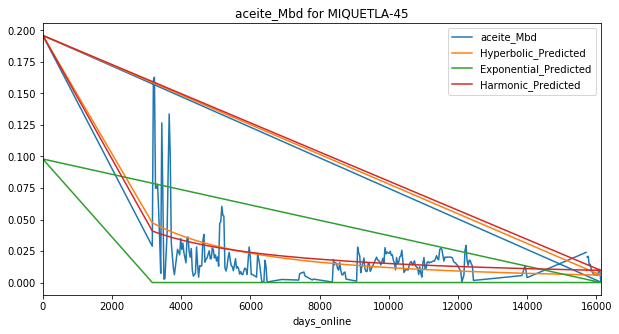

Exponential Fit Curve-fitted Variables: qi=0.086028, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.172055999992478, b=1.9999999999815337, di=0.016079734385410615
Harmonic Fit Curve-fitted Variables: qi=0.1708363173293489, di=0.0028574436443716575


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


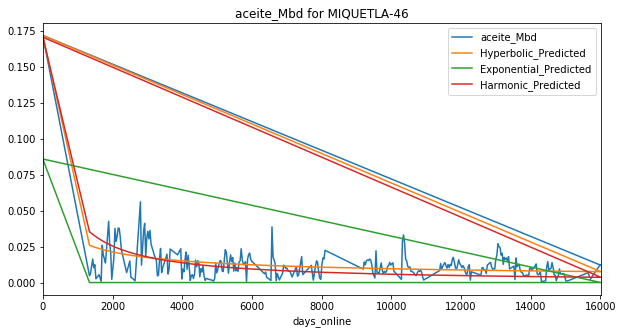

Exponential Fit Curve-fitted Variables: qi=0.169723, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25598995003805614, b=0.16196147391408747, di=0.00048372062980306304
Harmonic Fit Curve-fitted Variables: qi=0.25069415598436484, di=0.0011413152623732817


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


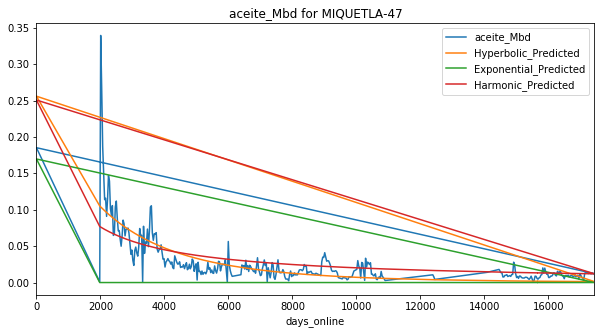

Exponential Fit Curve-fitted Variables: qi=0.088666, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1773319999999874, b=1.5285869522927684, di=0.008434578153799678
Harmonic Fit Curve-fitted Variables: qi=0.17733199999999144, di=0.0032881069165299082


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


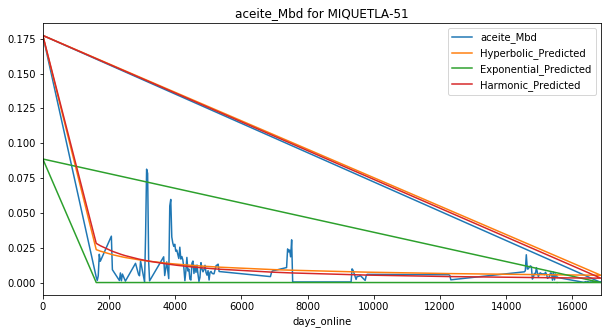

Exponential Fit Curve-fitted Variables: qi=0.076945, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15388999999999997, b=1.9999999999999998, di=0.010557151714959518
Harmonic Fit Curve-fitted Variables: qi=0.14661685970775343, di=0.002408258118433183


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


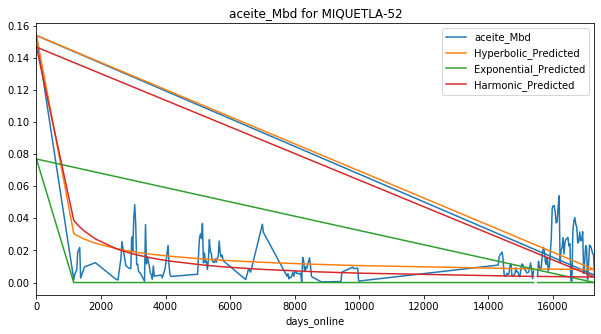

Exponential Fit Curve-fitted Variables: qi=0.037529, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04637748378559756, b=1.1338611191842678, di=0.00015229425768200234
Harmonic Fit Curve-fitted Variables: qi=0.04582834073335299, di=0.00013912856859444364


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


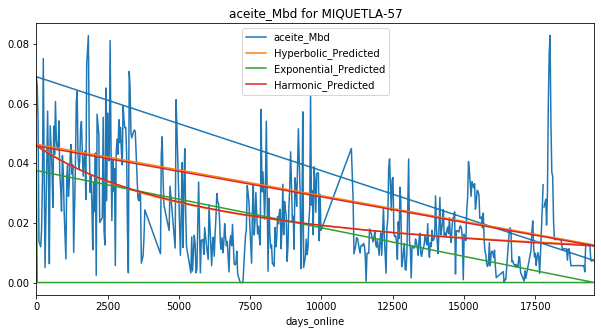

Exponential Fit Curve-fitted Variables: qi=0.117934, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.23586799999804195, b=1.5970261202148772, di=0.003916857980262628
Harmonic Fit Curve-fitted Variables: qi=0.23586799999999997, di=0.0011705812469946827


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


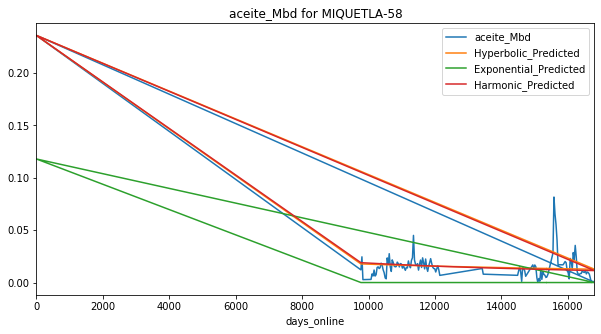

Exponential Fit Curve-fitted Variables: qi=0.060159000000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12031781348320397, b=1.9999999859585929, di=0.0019192846777967936
Harmonic Fit Curve-fitted Variables: qi=0.11337601909216324, di=0.00046613635787469036


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


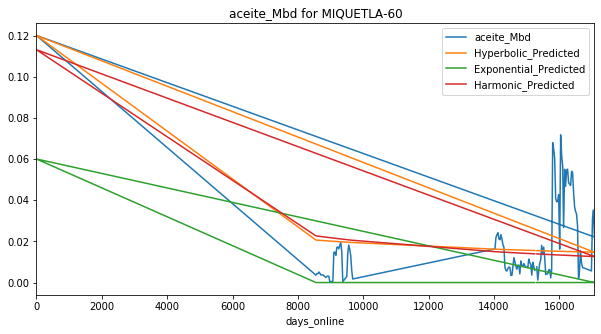

Exponential Fit Curve-fitted Variables: qi=0.057955999999999994, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11591199999999946, b=1.9999999999999865, di=0.034510559239160014
Harmonic Fit Curve-fitted Variables: qi=0.11591199999999997, di=0.023223626349400225


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


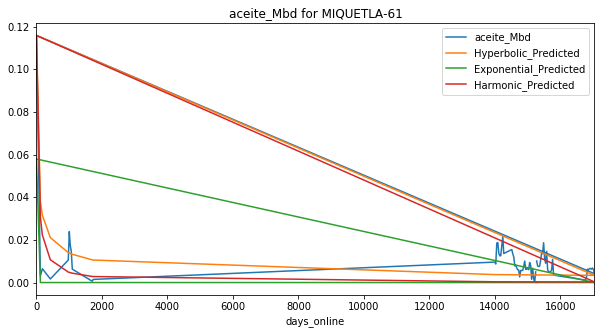

Exponential Fit Curve-fitted Variables: qi=0.069188, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13837599999999997, b=1.5728565934470808, di=0.002998102403563175
Harmonic Fit Curve-fitted Variables: qi=0.13837589255091845, di=0.0009654893970748649


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


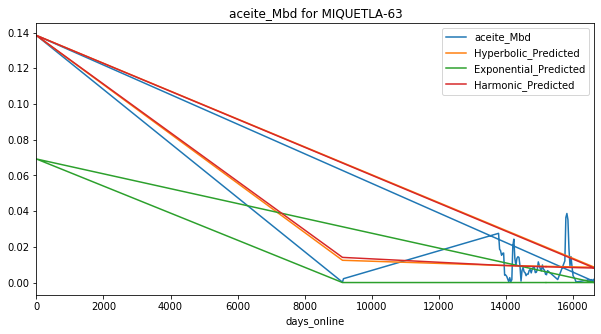

Exponential Fit Curve-fitted Variables: qi=0.051333000000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.058847284641448776, b=1.9999999999999998, di=0.001441332331787485
Harmonic Fit Curve-fitted Variables: qi=0.04243124868196464, di=0.00031171526844428384


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


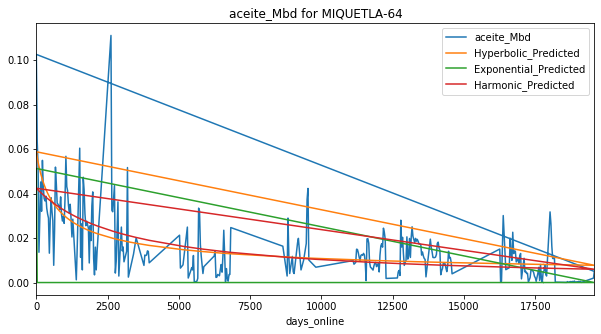

Exponential Fit Curve-fitted Variables: qi=0.040275, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08041508140831635, b=0.11940840849207333, di=0.00021820143957338025
Harmonic Fit Curve-fitted Variables: qi=0.08054999998842352, di=0.0007504525434517871


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


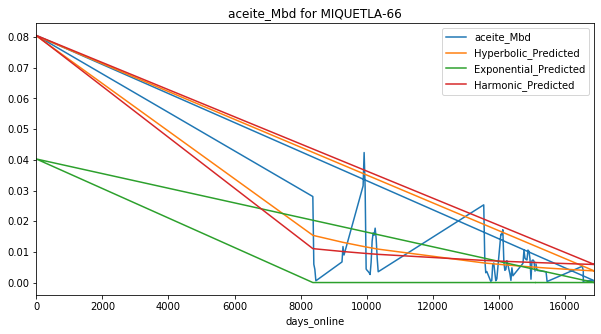

Exponential Fit Curve-fitted Variables: qi=0.033664, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.046918778706132876, b=1.8462877709623737, di=0.001760302060413787
Harmonic Fit Curve-fitted Variables: qi=0.04264366493883857, di=0.0009105264891421594


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


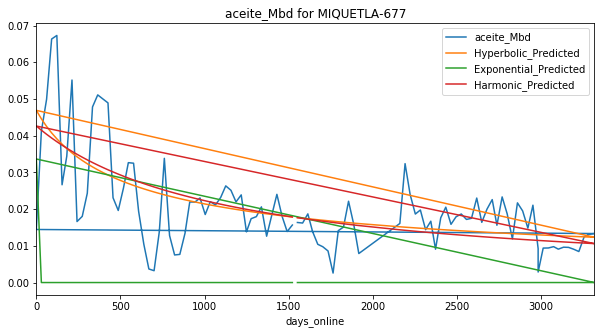

Exponential Fit Curve-fitted Variables: qi=0.051786, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1035719999999785, b=1.3662298667182298, di=0.00309842083819919
Harmonic Fit Curve-fitted Variables: qi=0.10357199999999998, di=0.0017188192426407128


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


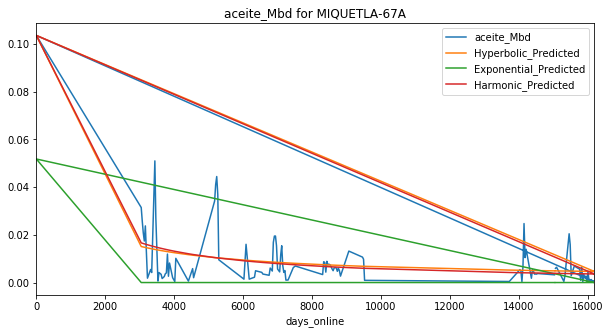

Exponential Fit Curve-fitted Variables: qi=0.090783, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18156599999999998, b=0.664984745654619, di=0.0007991952058923276
Harmonic Fit Curve-fitted Variables: qi=0.18156599999998976, di=0.0011523193379522872


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


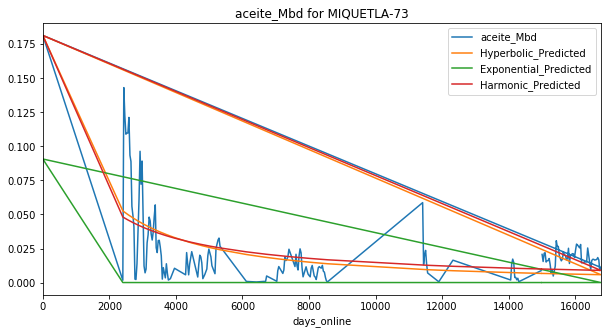

Exponential Fit Curve-fitted Variables: qi=0.011452500000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019991056806667407, b=1.9999999999999998, di=0.006616583738328796
Harmonic Fit Curve-fitted Variables: qi=0.011382307924493695, di=0.0007748192903215922


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


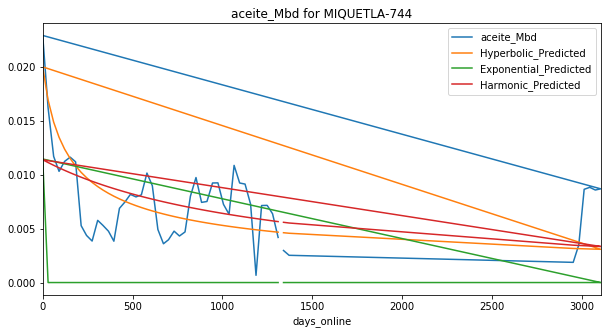

Exponential Fit Curve-fitted Variables: qi=0.077679, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1553579999999658, b=1.7180274516382164, di=0.004707179758193366
Harmonic Fit Curve-fitted Variables: qi=0.09873294300365218, di=0.0010450576563601473


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


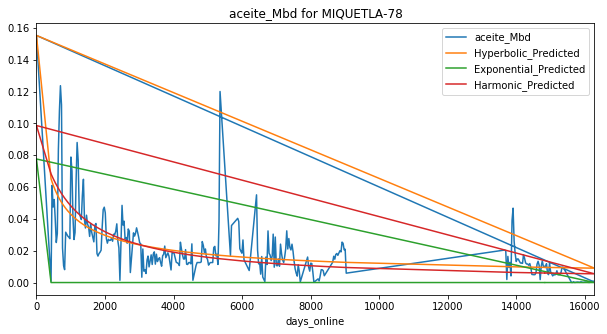

Exponential Fit Curve-fitted Variables: qi=0.08795599999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16278316377127094, b=0.6917123282606286, di=0.0010655296586272588
Harmonic Fit Curve-fitted Variables: qi=0.16692585226336001, di=0.0014937091141572535


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


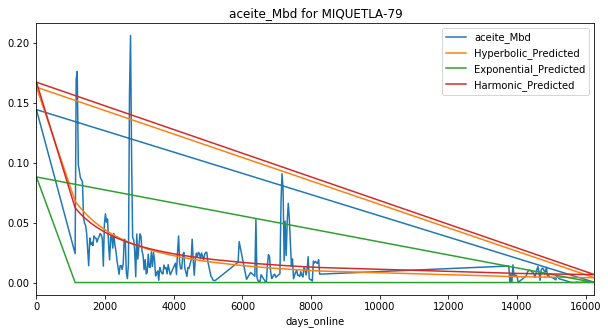

Exponential Fit Curve-fitted Variables: qi=0.1340135, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2300295232517752, b=7.681666727312766e-08, di=0.0005967418281882708
Harmonic Fit Curve-fitted Variables: qi=0.2155933455534463, di=0.0013248089331996844


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


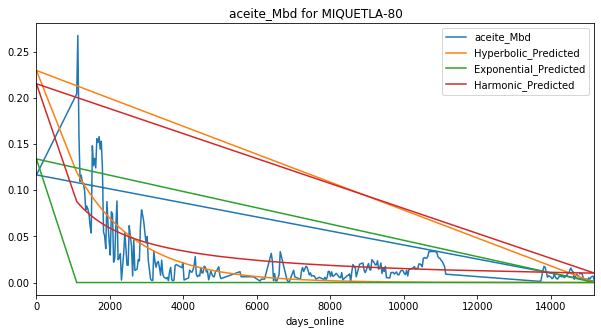

Exponential Fit Curve-fitted Variables: qi=0.05924600000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11849199999993572, b=1.3493866470377684, di=0.0015070207761737166
Harmonic Fit Curve-fitted Variables: qi=0.118492, di=0.0010083224918704782


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


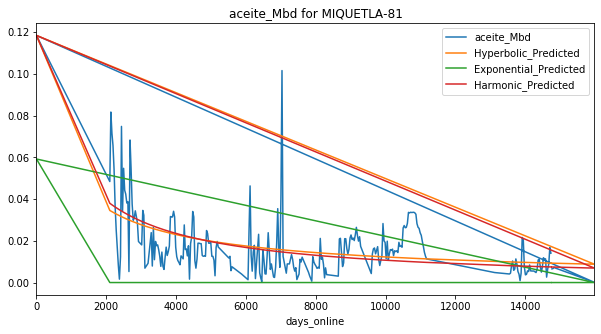

Exponential Fit Curve-fitted Variables: qi=0.05113, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05362509339789254, b=0.8278265060367943, di=0.00022111598874928045
Harmonic Fit Curve-fitted Variables: qi=0.054539798350778025, di=0.000249511535167246


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


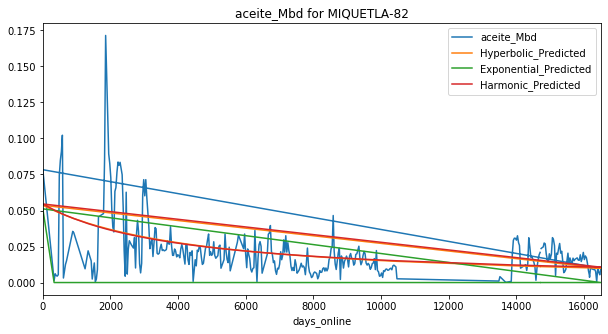

Exponential Fit Curve-fitted Variables: qi=0.1049435, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20988699999990165, b=4.443978889359401e-13, di=0.00034499068534369205
Harmonic Fit Curve-fitted Variables: qi=0.20988699999999993, di=0.0003785628959360401


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


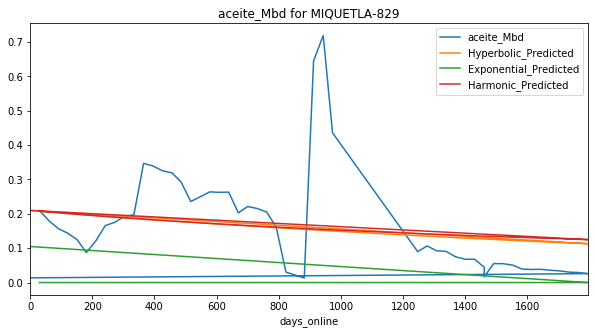

Exponential Fit Curve-fitted Variables: qi=0.0736515, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1473029999994239, b=1.1729166802791071, di=0.0011112115047693506
Harmonic Fit Curve-fitted Variables: qi=0.14730299630067575, di=0.0009180518713431729


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


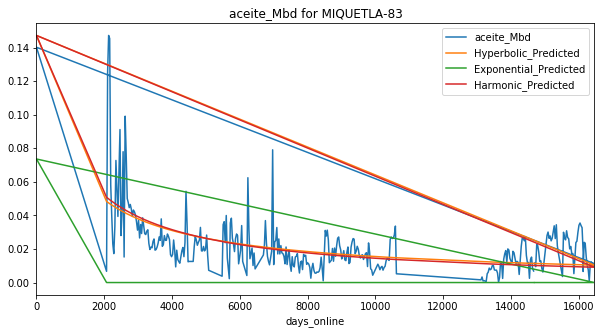

Exponential Fit Curve-fitted Variables: qi=0.1186945, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03289380086437458, b=1.9751588599491487, di=0.00013798778924716657
Harmonic Fit Curve-fitted Variables: qi=0.03086523818668149, di=8.28580946264105e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


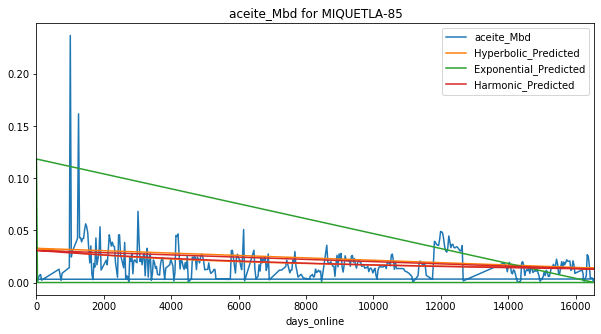

Exponential Fit Curve-fitted Variables: qi=0.0637095, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12741899999999928, b=1.9999999999999951, di=0.007943821471030206
Harmonic Fit Curve-fitted Variables: qi=0.12680659918989945, di=0.0012743660201532591


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


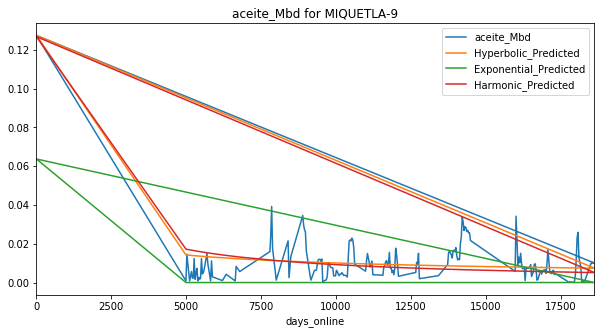

Exponential Fit Curve-fitted Variables: qi=0.02617, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.018451549545382223, b=1.9999999999999998, di=3.558183836985253e-05
Harmonic Fit Curve-fitted Variables: qi=0.017549668706572645, di=2.21921043152495e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


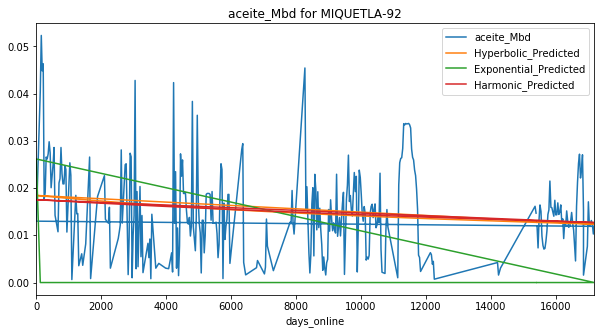

Exponential Fit Curve-fitted Variables: qi=0.0655935, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.027784233885602486, b=0.9837706425934531, di=0.00012254455208578094
Harmonic Fit Curve-fitted Variables: qi=0.02781614062194092, di=0.00012364468434788173


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


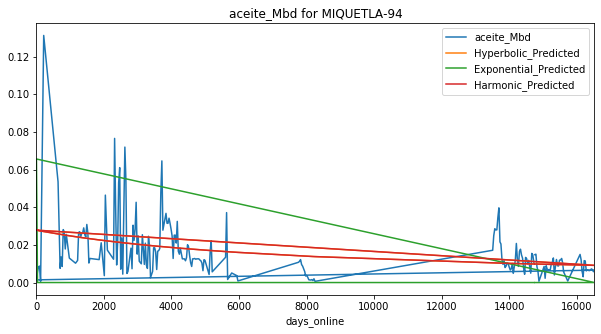

Exponential Fit Curve-fitted Variables: qi=0.028723500000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025822357470860466, b=3.2186641906927087e-10, di=5.138434476341353e-05
Harmonic Fit Curve-fitted Variables: qi=0.02659036240124033, di=7.317696454627994e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


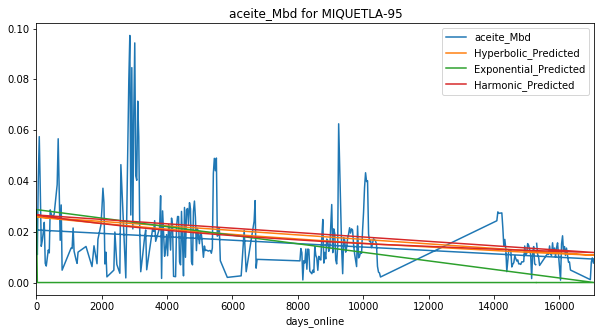

Exponential Fit Curve-fitted Variables: qi=0.0120725, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020347744434983696, b=1.1092952585305875, di=4.276853549232332e-05
Harmonic Fit Curve-fitted Variables: qi=0.020307309967039437, di=4.1541020750867456e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


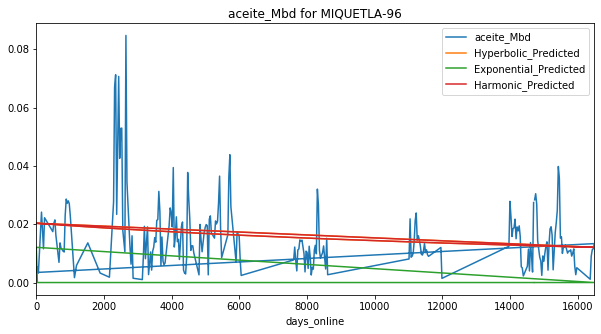

Exponential Fit Curve-fitted Variables: qi=0.042141500000000005, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.021327251491461915, b=1.9999999999999998, di=1.628665380565505e-17
Harmonic Fit Curve-fitted Variables: qi=0.021327251848492337, di=3.0751086304839597e-20


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


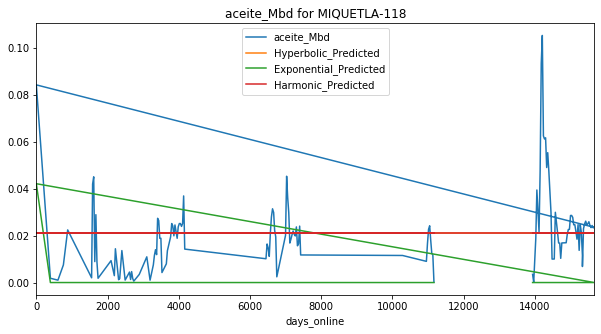

Exponential Fit Curve-fitted Variables: qi=0.0168775, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.028466309320973954, b=1.0687187296177183e-10, di=7.218646038583777e-05
Harmonic Fit Curve-fitted Variables: qi=0.031694212918500914, di=0.00013466137552375825


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


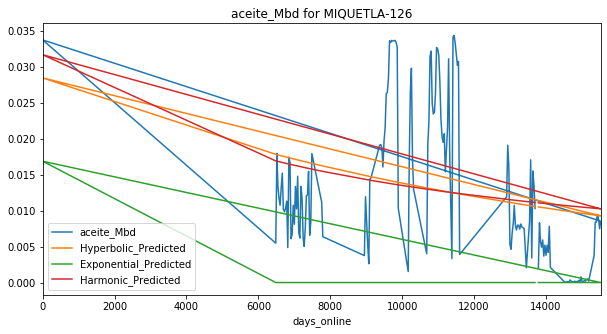

Exponential Fit Curve-fitted Variables: qi=0.08531799999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1706359972485898, b=1.99999999886028, di=0.017130430294655954
Harmonic Fit Curve-fitted Variables: qi=0.16426089187772755, di=0.005341302095685518


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


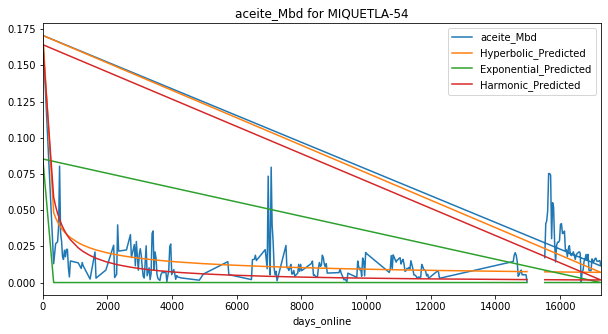

Exponential Fit Curve-fitted Variables: qi=0.0554245, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0849741102667149, b=0.8455001638580754, di=0.001833383395189614
Harmonic Fit Curve-fitted Variables: qi=0.08598558460331791, di=0.002032159349542817


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


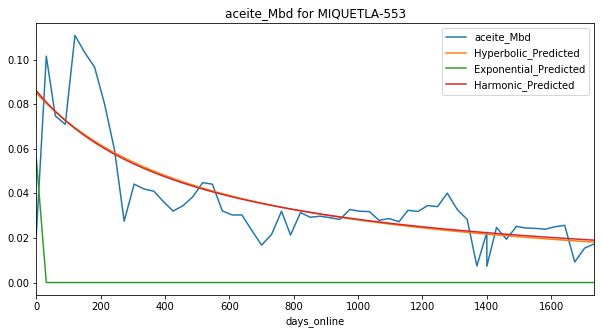

Exponential Fit Curve-fitted Variables: qi=0.040307499999999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04105474777900737, b=1.2235032134084665, di=0.0013638697140297361
Harmonic Fit Curve-fitted Variables: qi=0.04067806232344137, di=0.001224448428996375


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


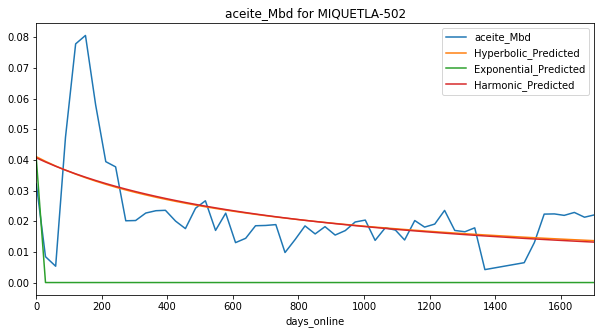

Exponential Fit Curve-fitted Variables: qi=0.02191, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02687491146125112, b=0.5053365135162275, di=0.0013198681824085395
Harmonic Fit Curve-fitted Variables: qi=0.02774956645638115, di=0.001776391896447236


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


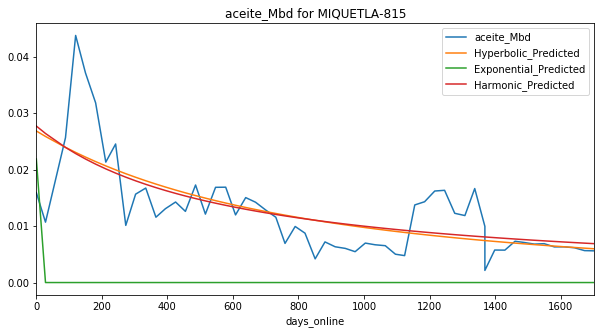

Exponential Fit Curve-fitted Variables: qi=0.059181500000000005, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06923369627525817, b=0.2456448148949808, di=0.002709557790844499
Harmonic Fit Curve-fitted Variables: qi=0.07140303871789709, di=0.004691504407155151


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


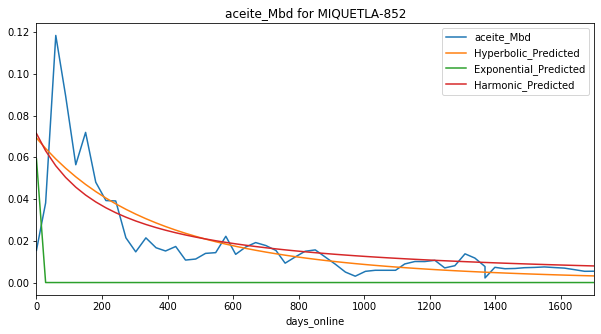

Exponential Fit Curve-fitted Variables: qi=0.055455, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10435849574969293, b=1.9999999999999998, di=0.0010747079406985024
Harmonic Fit Curve-fitted Variables: qi=0.02265708969715384, di=4.239521304351417e-16


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


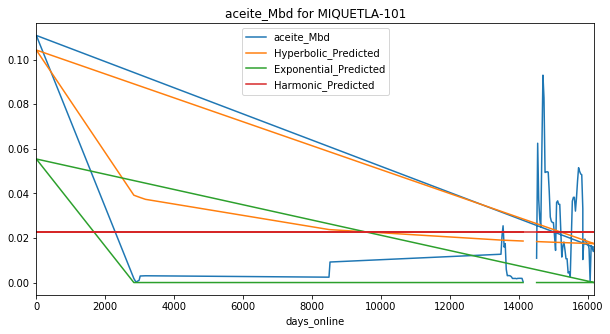

Exponential Fit Curve-fitted Variables: qi=0.038956, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07789306986642021, b=2.9537138268225946e-08, di=0.00016016456107410798
Harmonic Fit Curve-fitted Variables: qi=0.07791199997729448, di=0.0006716822537534546


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


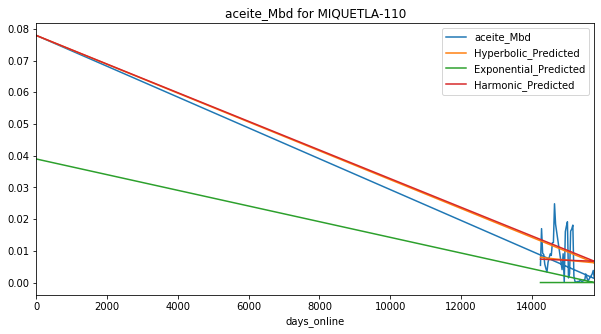

Exponential Fit Curve-fitted Variables: qi=0.056101, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11220199999999998, b=1.9999999999999998, di=0.011564650542336916
Harmonic Fit Curve-fitted Variables: qi=0.11160173538654637, di=0.002471180234918911


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


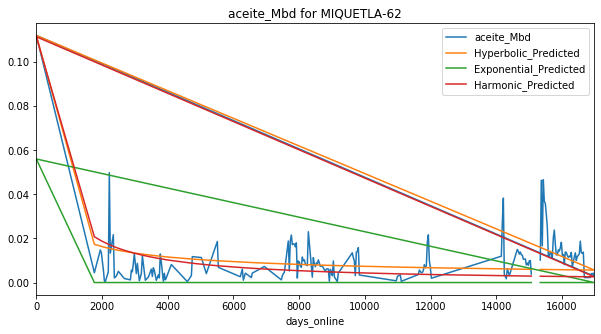

Exponential Fit Curve-fitted Variables: qi=0.0822745, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16454899999999997, b=1.8145845630467483, di=0.00593210226131631
Harmonic Fit Curve-fitted Variables: qi=0.16454892807569654, di=0.0011963380920382057


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


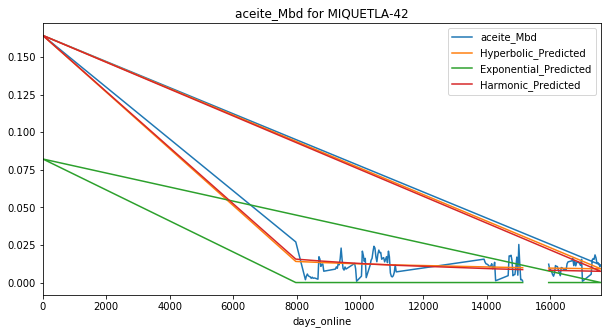

Exponential Fit Curve-fitted Variables: qi=0.019376499999999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0178520533227168, b=1.9999999638939214, di=0.00020454425948680392
Harmonic Fit Curve-fitted Variables: qi=0.015457874282653215, di=9.019286970594103e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


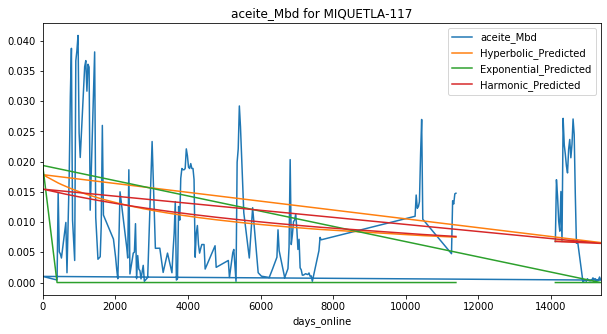

Exponential Fit Curve-fitted Variables: qi=0.058333, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07635763154172258, b=0.2132016413216106, di=0.00029642408582413875
Harmonic Fit Curve-fitted Variables: qi=0.0835362786469287, di=0.0005960758962134758


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


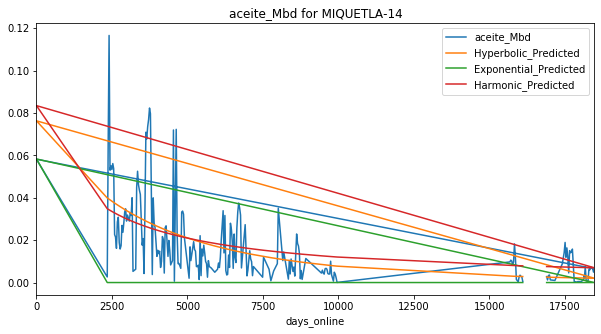

Exponential Fit Curve-fitted Variables: qi=0.12611050000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25222099999999964, b=1.2516606412116582, di=0.004130692964243137
Harmonic Fit Curve-fitted Variables: qi=0.252221, di=0.002689931643161385


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


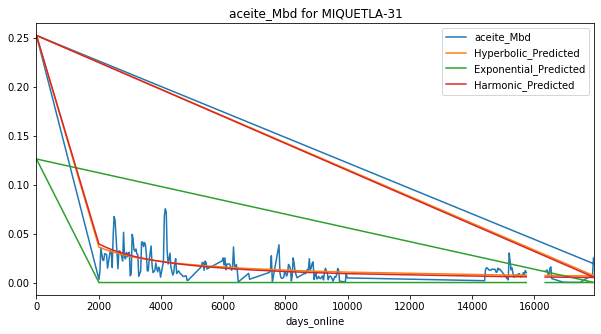

Exponential Fit Curve-fitted Variables: qi=0.0509475, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10189499999996882, b=1.9999999999992444, di=0.020736457179914243
Harmonic Fit Curve-fitted Variables: qi=0.0996387515875774, di=0.005846942518214781


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


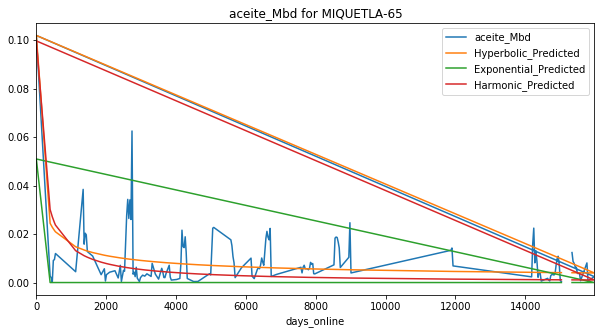

Exponential Fit Curve-fitted Variables: qi=0.08103350000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.162067, b=1.0860725130405737, di=0.0018270616786444135
Harmonic Fit Curve-fitted Variables: qi=0.16206699731703356, di=0.0015273381374493887


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


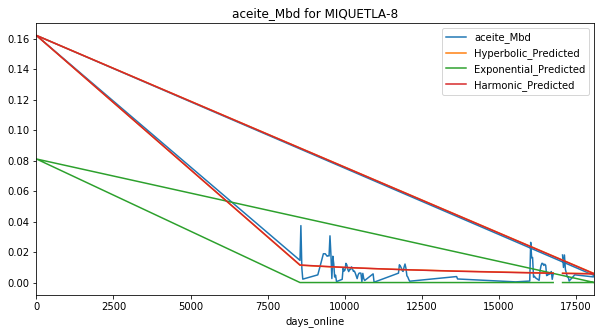

Exponential Fit Curve-fitted Variables: qi=0.070405, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14080999999999996, b=1.9999999996608608, di=0.019332922897497475
Harmonic Fit Curve-fitted Variables: qi=0.1407989388087066, di=0.004301663123139781


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


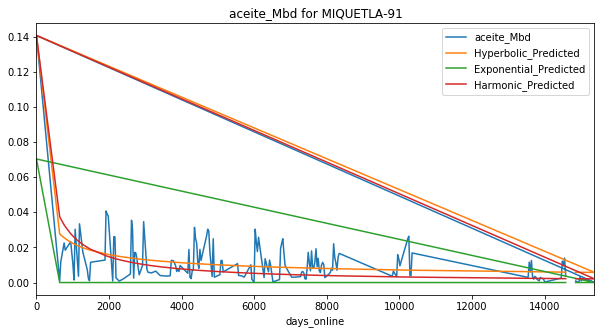

Exponential Fit Curve-fitted Variables: qi=0.119843, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2396859999999992, b=1.400262644961864, di=0.004593542309745984
Harmonic Fit Curve-fitted Variables: qi=0.23968599999999987, di=0.0023492519969714265


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


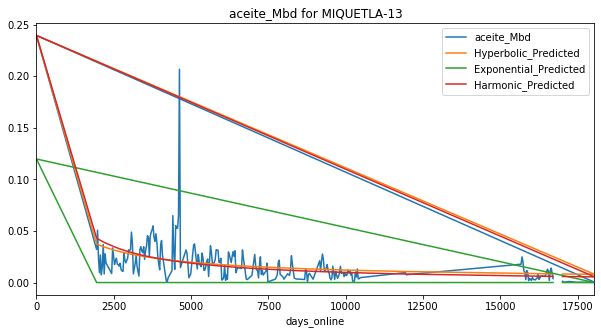

Exponential Fit Curve-fitted Variables: qi=0.07912949999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11637171789826453, b=0.8288789029923528, di=0.000684618607995808
Harmonic Fit Curve-fitted Variables: qi=0.1243483744027002, di=0.0008592753245426094


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


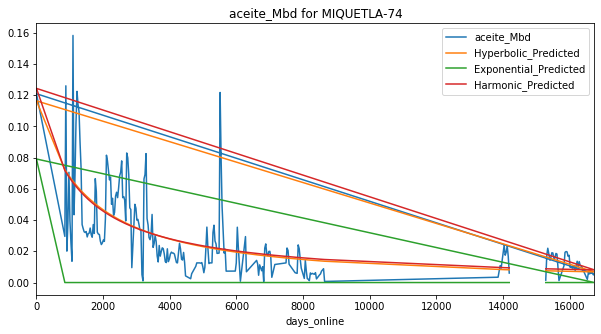

Exponential Fit Curve-fitted Variables: qi=0.060970500000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12194099999954718, b=1.2244263568066927, di=0.001406596701079059
Harmonic Fit Curve-fitted Variables: qi=0.1219409999999947, di=0.0011561557120141205


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


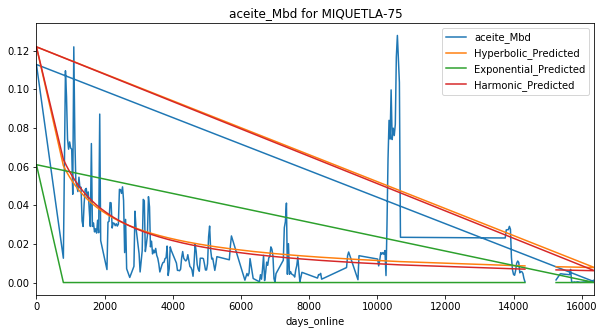

Exponential Fit Curve-fitted Variables: qi=0.084202, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16840399999999986, b=1.1598738445719736, di=0.0014301136000258296
Harmonic Fit Curve-fitted Variables: qi=0.16840399999999997, di=0.0010964865718063467


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


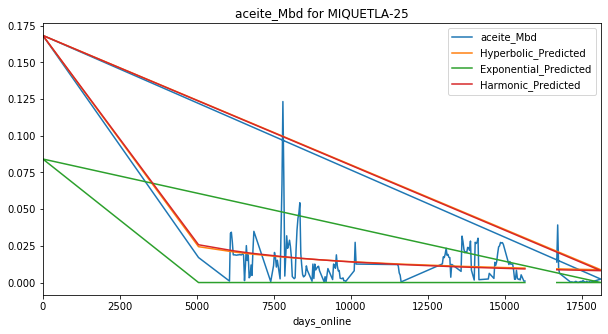

Exponential Fit Curve-fitted Variables: qi=0.0727385, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.037222526611360114, b=1.9999999999999998, di=0.00027932542679823475
Harmonic Fit Curve-fitted Variables: qi=0.030625388828716772, di=0.0001101788365565864


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


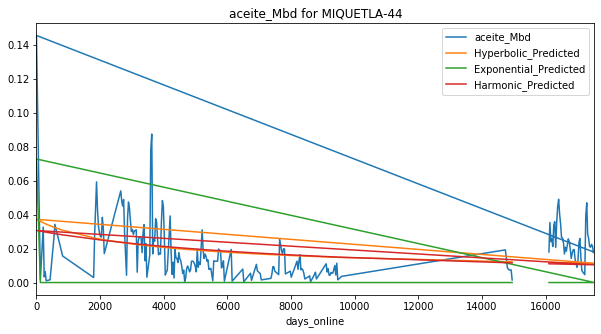

Exponential Fit Curve-fitted Variables: qi=0.062898, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1257959999999982, b=1.163053513307574, di=0.002415252751794646
Harmonic Fit Curve-fitted Variables: qi=0.1257946812389081, di=0.0019834655396635775


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


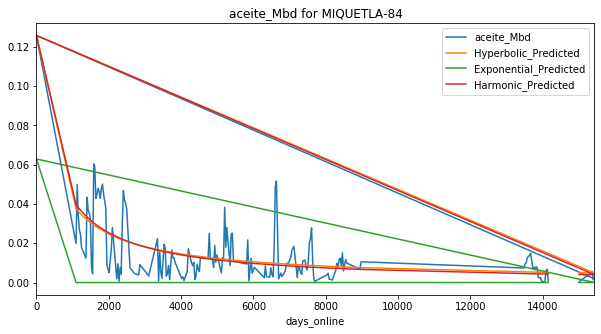

Exponential Fit Curve-fitted Variables: qi=0.119668674, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20133275933292652, b=7.2795323713780225e-09, di=0.0005385089039369707
Harmonic Fit Curve-fitted Variables: qi=0.19607185032205368, di=0.000615501172906127


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


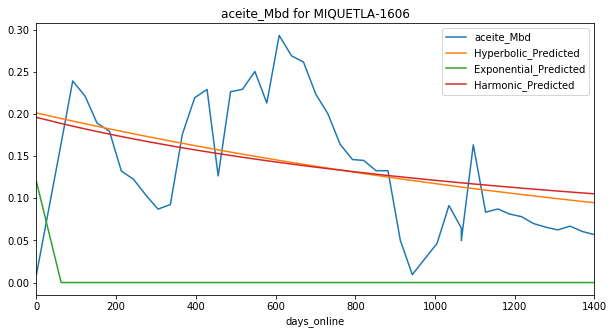

Exponential Fit Curve-fitted Variables: qi=0.1093375, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21867499999999998, b=0.2207943256218874, di=0.0003186017760068382
Harmonic Fit Curve-fitted Variables: qi=0.2186749999999995, di=0.0016946267956984124


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


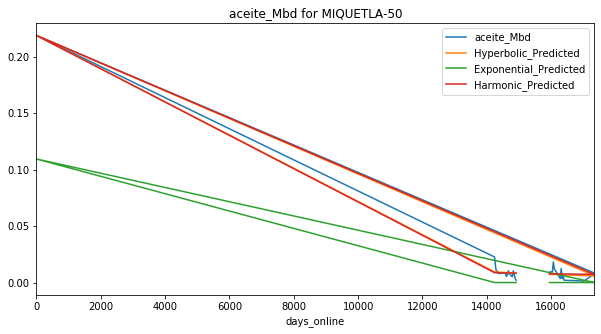

Exponential Fit Curve-fitted Variables: qi=0.091705389, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1017162160372554, b=8.264602163565423e-12, di=0.0004259268159271736
Harmonic Fit Curve-fitted Variables: qi=0.09961452044391673, di=0.00046670877626710336


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


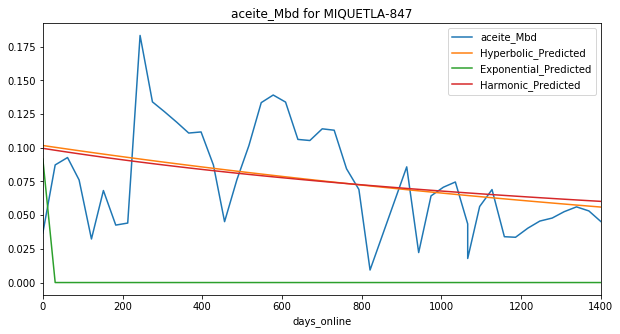

Exponential Fit Curve-fitted Variables: qi=0.0012932075, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0025864149992852466, b=1.1340677637551373, di=0.026268867116789326
Harmonic Fit Curve-fitted Variables: qi=0.0025864149999937826, di=0.023227467131208993


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


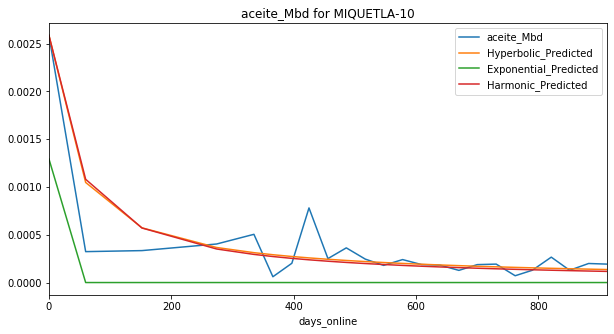

Exponential Fit Curve-fitted Variables: qi=0.023395371499999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03039564661907524, b=0.5035160972099664, di=0.0010580834333289745
Harmonic Fit Curve-fitted Variables: qi=0.03124639432500695, di=0.0013566321684568407


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


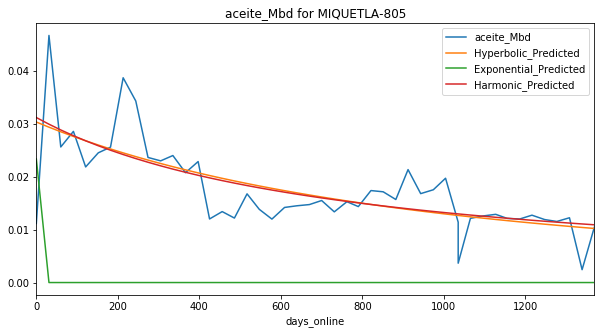

Exponential Fit Curve-fitted Variables: qi=0.052751098499999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09801515944778537, b=5.8383529992930733e-08, di=0.0004823999793214435
Harmonic Fit Curve-fitted Variables: qi=0.09840570186917781, di=0.0005981969590483857


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


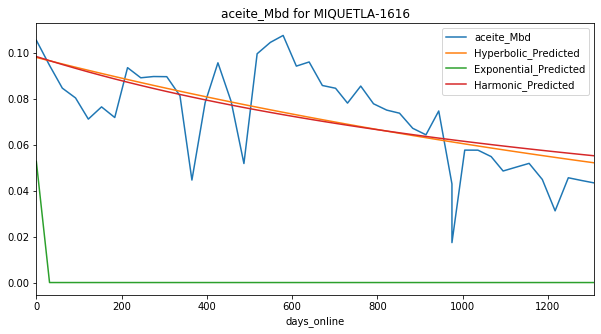

Exponential Fit Curve-fitted Variables: qi=0.057313272, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07405443231249124, b=1.9999999999999998, di=9.464886567477174e-05
Harmonic Fit Curve-fitted Variables: qi=0.07395749298588121, di=8.88991679807908e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


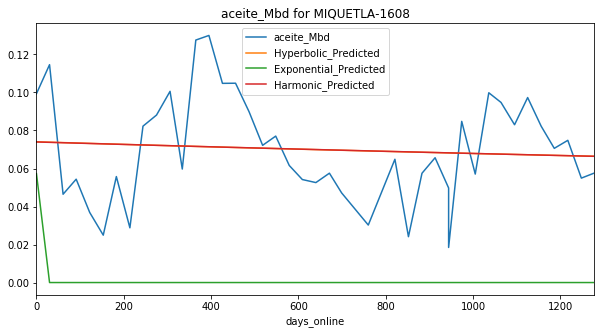

Exponential Fit Curve-fitted Variables: qi=0.015046859, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.015508337882146814, b=1.9999999999998812, di=0.0029401426231473117
Harmonic Fit Curve-fitted Variables: qi=0.013798953597952811, di=0.0014032663870090357


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


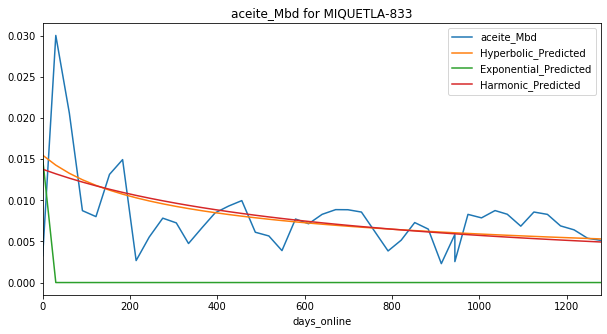

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.013328788999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02665756454850659, b=2.142208190826994e-07, di=0.013938945660667957
Harmonic Fit Curve-fitted Variables: qi=0.026657577999999994, di=0.022239981187169994


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


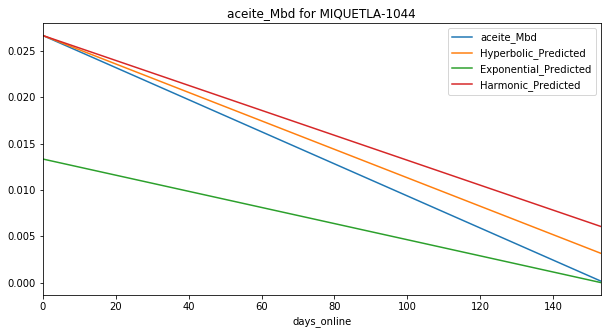

Exponential Fit Curve-fitted Variables: qi=0.0470565025, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09258580936050788, b=9.268674588163695e-10, di=0.0029707314113727673
Harmonic Fit Curve-fitted Variables: qi=0.09411300499999999, di=0.005513053527775937


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


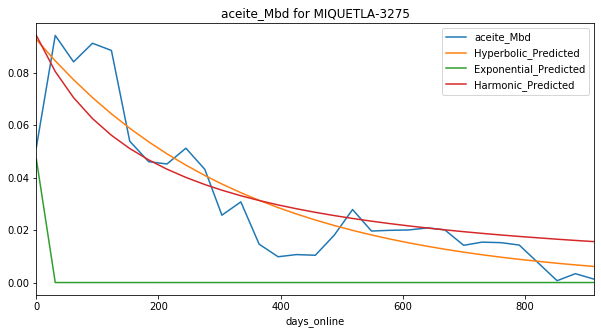

Exponential Fit Curve-fitted Variables: qi=0.0127825, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02556499999995779, b=3.976750517242393e-09, di=8.060304805057742e-05
Harmonic Fit Curve-fitted Variables: qi=0.0255649999800939, di=0.00015984523057247692


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


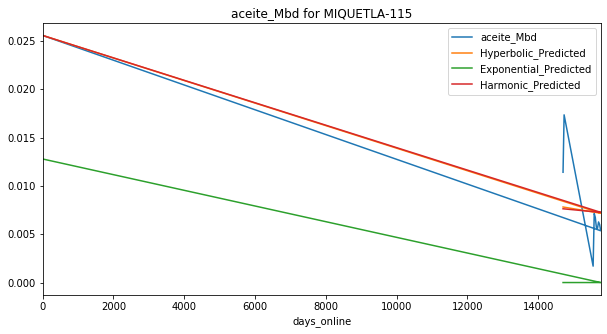

Exponential Fit Curve-fitted Variables: qi=0.01845, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.024798253417820843, b=1.9999999999999998, di=0.00010346403587222865
Harmonic Fit Curve-fitted Variables: qi=0.02330946588075809, di=6.192438826724206e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


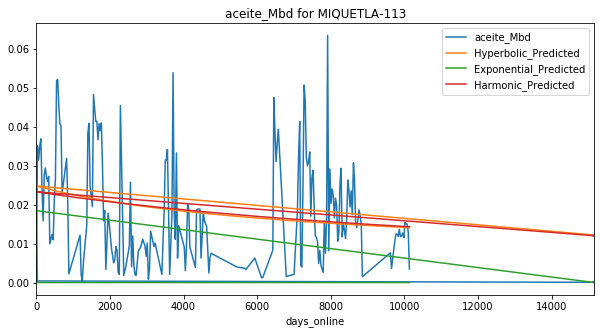

Exponential Fit Curve-fitted Variables: qi=0.09597, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14305093604784466, b=0.7004639007443051, di=0.0008013219477265377
Harmonic Fit Curve-fitted Variables: qi=0.16993033355221165, di=0.0013207280660677708


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


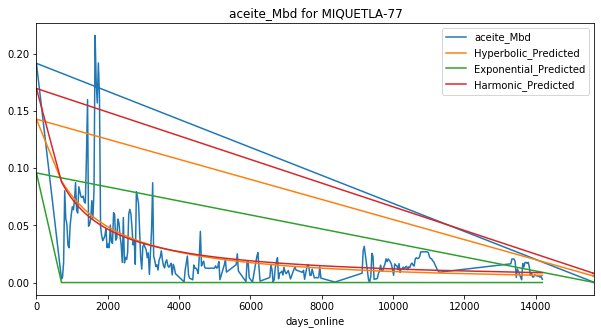

Exponential Fit Curve-fitted Variables: qi=0.134419, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.26883799999999985, b=1.1601430546084819, di=0.002064080036883055
Harmonic Fit Curve-fitted Variables: qi=0.26882117157904145, di=0.0016537761384861074


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


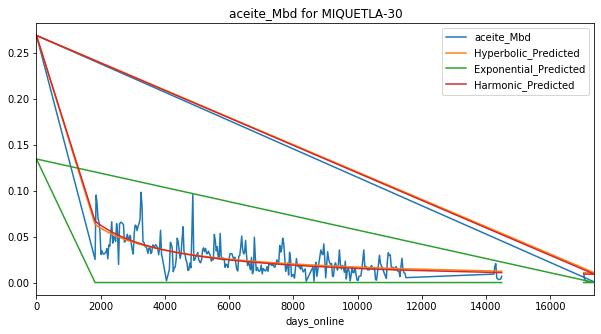

Exponential Fit Curve-fitted Variables: qi=0.18199849999999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.36399699999998314, b=1.0749070550930047, di=0.0036568454490960908
Harmonic Fit Curve-fitted Variables: qi=0.3639968347098237, di=0.003172284585561723


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


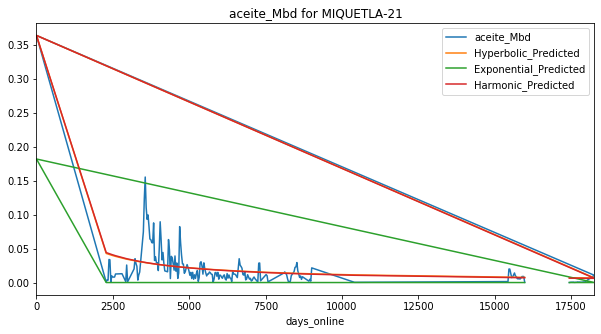

Exponential Fit Curve-fitted Variables: qi=0.070440861, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10381887969422456, b=8.035934832165976e-12, di=0.0014952726845114297
Harmonic Fit Curve-fitted Variables: qi=0.10579378079246543, di=0.0020679605626674523


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


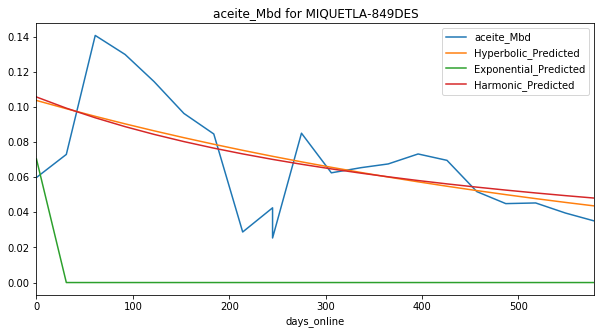

Exponential Fit Curve-fitted Variables: qi=0.11021628, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09511984353536648, b=1.9999999999217453, di=0.00013024650055065966
Harmonic Fit Curve-fitted Variables: qi=0.09504922299453647, di=0.00012446422611627205


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


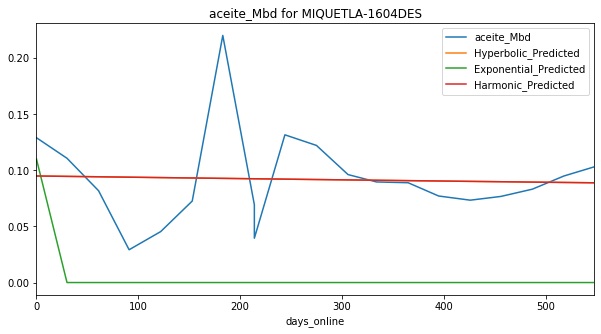

Exponential Fit Curve-fitted Variables: qi=0.046464727000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07430577914339292, b=1.9280585641015925e-05, di=0.001863509832256853
Harmonic Fit Curve-fitted Variables: qi=0.07520099239565524, di=0.0025379812586296766


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


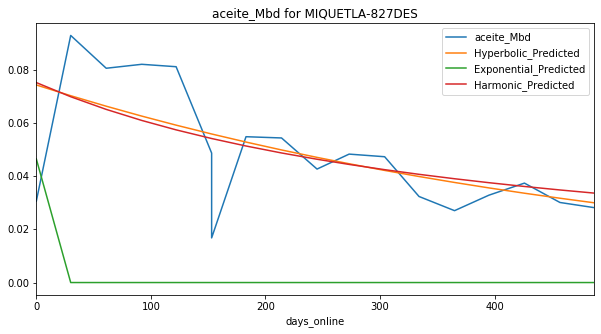

Exponential Fit Curve-fitted Variables: qi=0.049455288, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04451658642697083, b=1.9999998351020212, di=2.503022365572293e-17
Harmonic Fit Curve-fitted Variables: qi=0.044516588266326484, di=1.598199106296116e-11


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


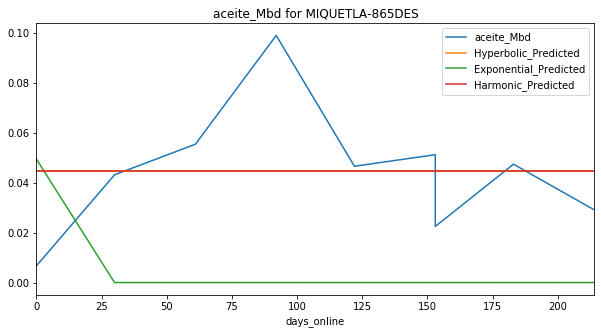

Exponential Fit Curve-fitted Variables: qi=0.0237916785, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04138668074589328, b=0.10471903028959062, di=0.0029828084732012932
Harmonic Fit Curve-fitted Variables: qi=0.043757934554714176, di=0.004773375862822925


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


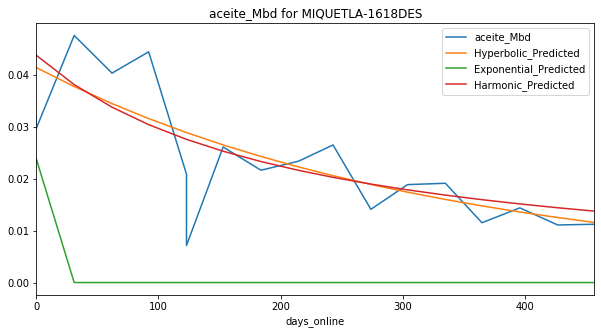

Exponential Fit Curve-fitted Variables: qi=0.025330601, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04353967602603532, b=1.852938773377486, di=0.0031034670241420707
Harmonic Fit Curve-fitted Variables: qi=0.042224581271118646, di=0.0022283121738211585


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


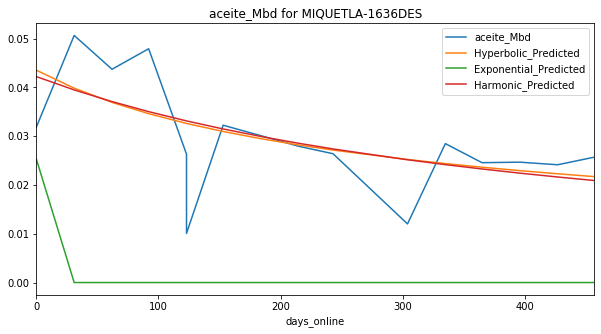

Exponential Fit Curve-fitted Variables: qi=0.0268197225, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03268371229467038, b=1.9589063045277744e-09, di=0.002530054910200248
Harmonic Fit Curve-fitted Variables: qi=0.032066716724678264, di=0.003241549869957054


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


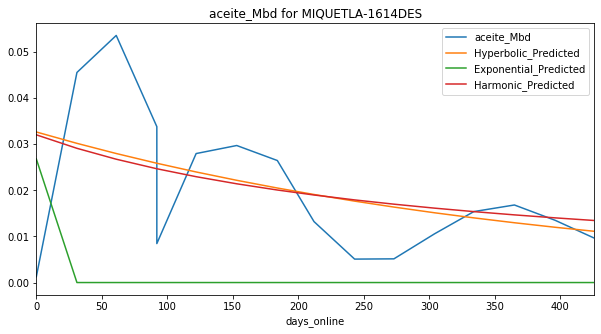

Exponential Fit Curve-fitted Variables: qi=0.11132950000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.222659, b=1.9579750772034057, di=0.012245090403470651
Harmonic Fit Curve-fitted Variables: qi=0.2226589999999554, di=0.001988870847815621


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


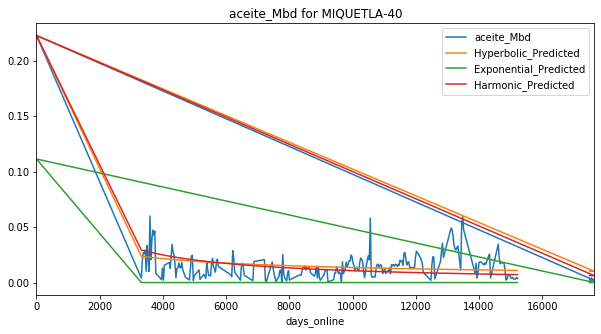

Exponential Fit Curve-fitted Variables: qi=0.0473765, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09475299999999999, b=4.406502379894688e-12, di=0.0001436641049744831
Harmonic Fit Curve-fitted Variables: qi=0.09475299999983353, di=0.0002397112653605661


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


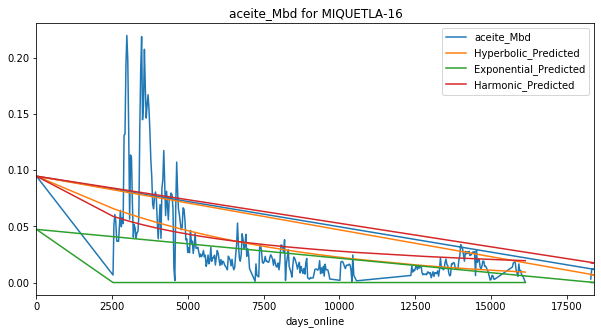

Exponential Fit Curve-fitted Variables: qi=0.0987095, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19741899999955215, b=1.6807132238856985, di=0.002713216439665518
Harmonic Fit Curve-fitted Variables: qi=0.1674650485639748, di=0.0009643246071126293


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


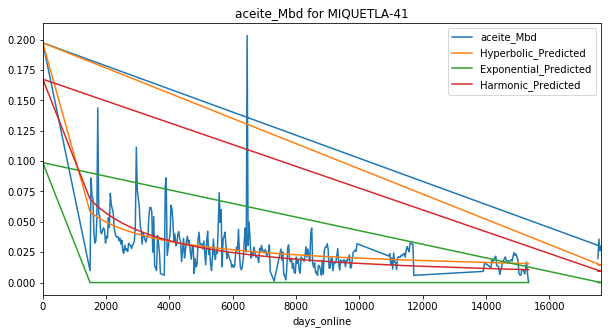

Exponential Fit Curve-fitted Variables: qi=0.10409600000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20819199966259405, b=1.999999999999967, di=0.004723005141642347
Harmonic Fit Curve-fitted Variables: qi=0.031005978846984215, di=2.4759714059338674e-19


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


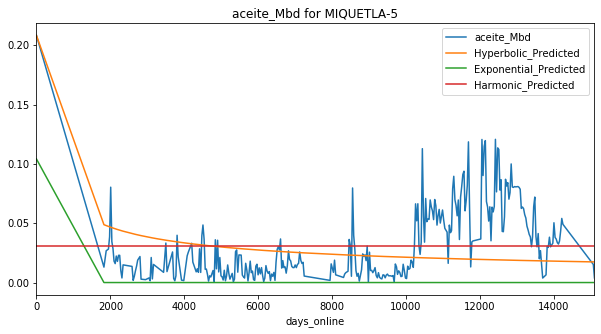

Exponential Fit Curve-fitted Variables: qi=0.1595785, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.31915699999997854, b=0.18658048180973574, di=0.0005660630954848044
Harmonic Fit Curve-fitted Variables: qi=0.31915699999998076, di=0.0017476280832184165


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


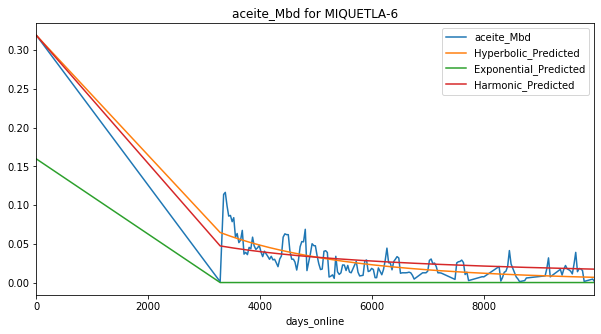

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.098608, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19716232964031355, b=0.8985941045341896, di=1.188685210059458e-05
Harmonic Fit Curve-fitted Variables: qi=0.1971581883514684, di=3.044898421619794e-15


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


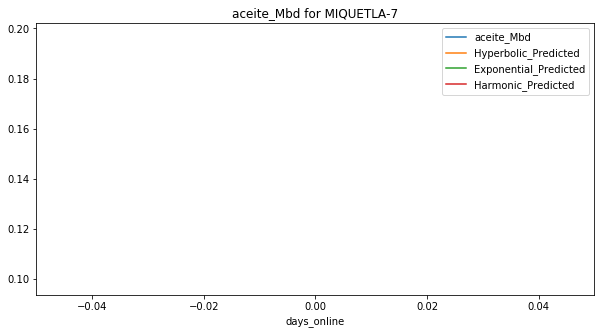

Exponential Fit Curve-fitted Variables: qi=0.06415599999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12831199999998052, b=1.9716039524058595e-09, di=0.00027891163598258725
Harmonic Fit Curve-fitted Variables: qi=0.12831199999999787, di=0.0006229927945602716


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


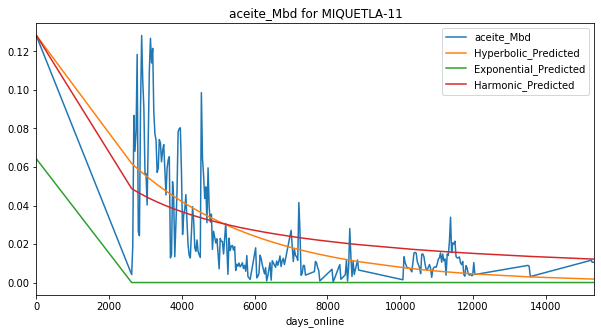

Exponential Fit Curve-fitted Variables: qi=0.07426, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13404059839564933, b=0.3738255965142693, di=0.00043190024601893345
Harmonic Fit Curve-fitted Variables: qi=0.1485199999999985, di=0.0009587276322652463


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


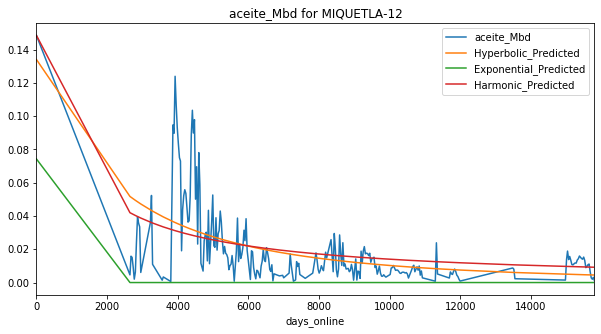

Exponential Fit Curve-fitted Variables: qi=0.1860565, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.37211299999990577, b=0.7302649917923661, di=0.001001805950035111
Harmonic Fit Curve-fitted Variables: qi=0.37211299999998093, di=0.0015223201514066535


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


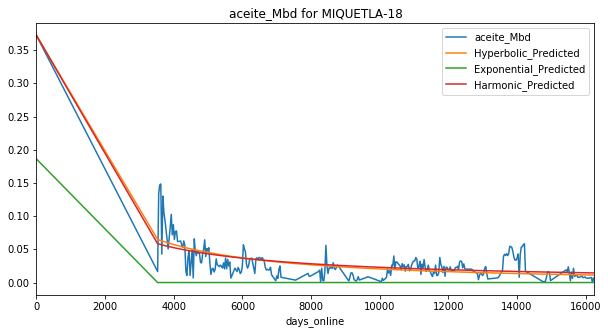

Exponential Fit Curve-fitted Variables: qi=0.25565, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5112999999999999, b=0.14732396802687872, di=0.0003764751740473547
Harmonic Fit Curve-fitted Variables: qi=0.5112999999999999, di=0.0032358786567333276


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


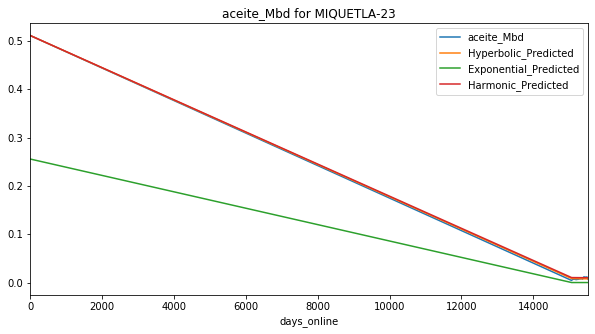

Exponential Fit Curve-fitted Variables: qi=0.13391199999999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2678239999999999, b=2.5174335788782074e-06, di=0.0005062658494354143
Harmonic Fit Curve-fitted Variables: qi=0.2678239999999999, di=0.0032811568451799667

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


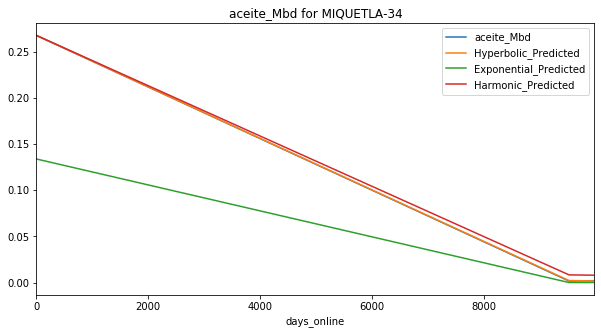

Exponential Fit Curve-fitted Variables: qi=0.1334045, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25904485847578956, b=8.95747504481838e-08, di=0.0003913787911122717
Harmonic Fit Curve-fitted Variables: qi=0.266808999999998, di=0.000949280426313333


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


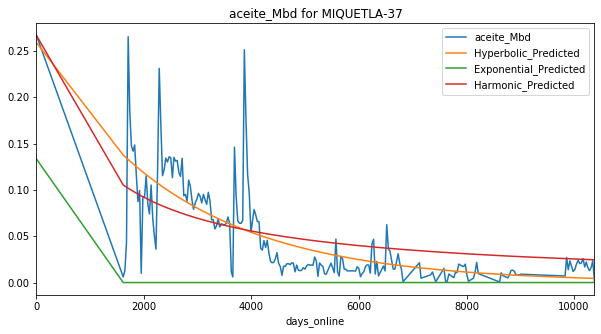

Exponential Fit Curve-fitted Variables: qi=0.1452945, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2905889999999973, b=4.4455118637037976e-08, di=0.000449708804078008
Harmonic Fit Curve-fitted Variables: qi=0.29058899999999993, di=0.0014500354470611862


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


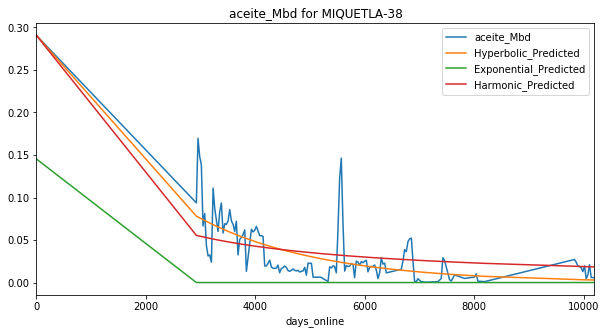

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.1362065, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2724129998093522, b=7.466454755804812e-08, di=0.0003882337725780507


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


Harmonic Fit Curve-fitted Variables: qi=0.27241299999999996, di=0.0023183552028718728


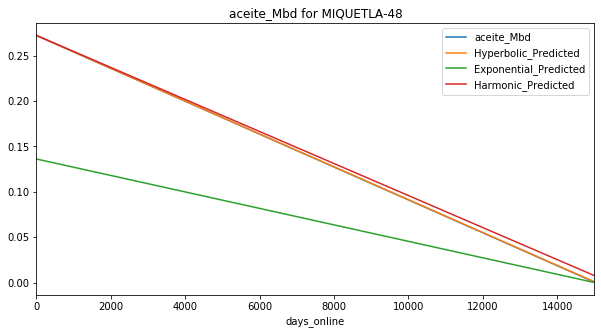

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.11575250000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.23140694891062613, b=0.8921525568310649, di=9.390600265102896e-07
Harmonic Fit Curve-fitted Variables: qi=0.23141951374471692, di=7.074373431356344e-12


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


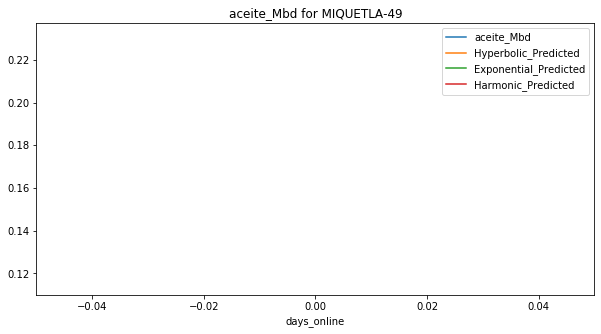

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.07984, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15962318256228825, b=0.9048009877483199, di=5.740108954961497e-07
Harmonic Fit Curve-fitted Variables: qi=0.1595927792648355, di=8.649258974227139e-06


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


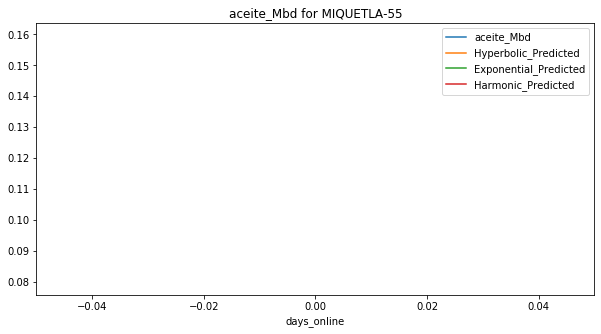

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.06436549999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12873099909421298, b=1.1635443544063786, di=4.015368378746036e-05
Harmonic Fit Curve-fitted Variables: qi=0.12872035187955258, di=4.410980182463092e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


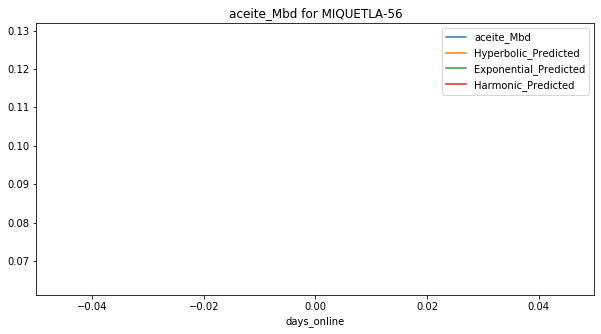

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.12052049999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2409960308657099, b=0.8902389344931949, di=3.6904151483481125e-06
Harmonic Fit Curve-fitted Variables: qi=0.24094361198847153, di=9.406065475684496e-12


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


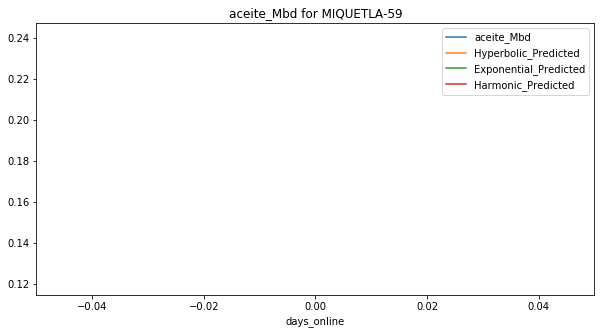

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.048188, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0963759994541461, b=1.051378473602073, di=5.858830870895547e-05
Harmonic Fit Curve-fitted Variables: qi=0.09637579315866018, di=5.805111132431604e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


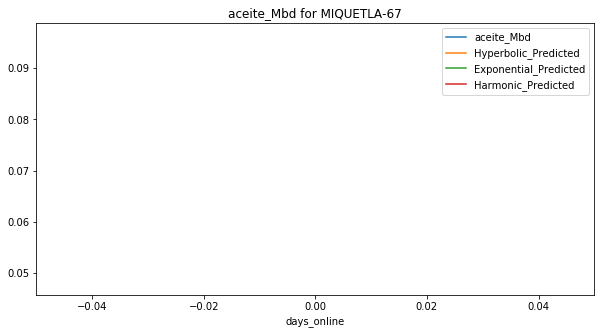

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.065637, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13127399697713657, b=1.0972906192835974, di=5.057698859640987e-05
Harmonic Fit Curve-fitted Variables: qi=0.13125859131375034, di=4.556493773413263e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


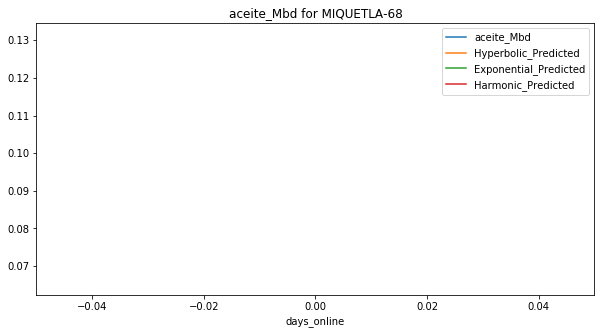

Exponential Fit Curve-fitted Variables: qi=0.0410935, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08218699999999617, b=6.724067879656538e-07, di=0.00034587784432020573
Harmonic Fit Curve-fitted Variables: qi=0.08218699999993347, di=0.0006049419850949298


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


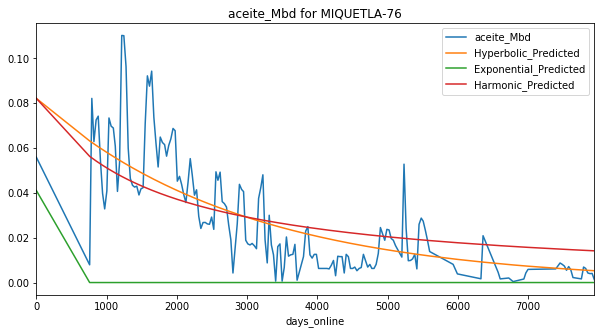

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.056608000000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11321599903458411, b=1.101991589832299, di=4.014496678682673e-05
Harmonic Fit Curve-fitted Variables: qi=0.11321571163330207, di=7.041137730168936e-05


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


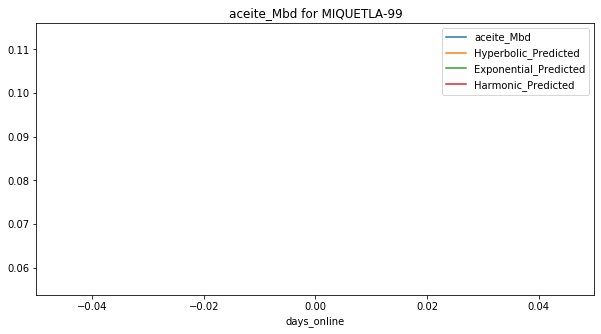

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Exponential Fit Curve-fitted Variables: qi=0.0184635, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03691062121365534, b=1.9735147328467877, di=5.207624841060965e-06
Harmonic Fit Curve-fitted Variables: qi=0.036926999404310004, di=0.00016074024789839139


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


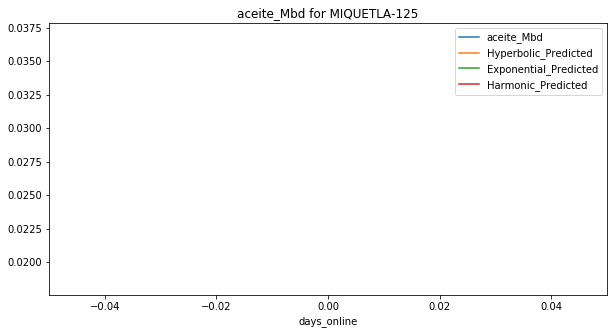

C:\Users\elias\Anaconda\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)


Exponential Fit Curve-fitted Variables: qi=0.017449, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03488235247104889, b=1.9735115434424533, di=4.6489709422184444e-06
Harmonic Fit Curve-fitted Variables: qi=0.03489799996825771, di=0.00016873158138647285


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
C:\Users\elias\Anaconda\lib\site-packages\pandas\plotting\_core.py:1001: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


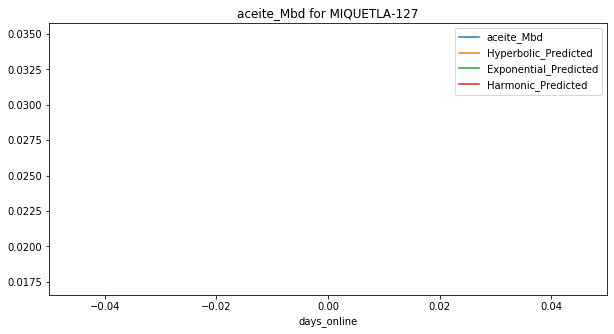

Exponential Fit Curve-fitted Variables: qi=0.006109000000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.005385949163527964, b=2.391537950118457e-05, di=7.163948876022128e-06
Harmonic Fit Curve-fitted Variables: qi=0.005392239829551765, di=8.069335763966408e-06


C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\elias\Anaconda\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


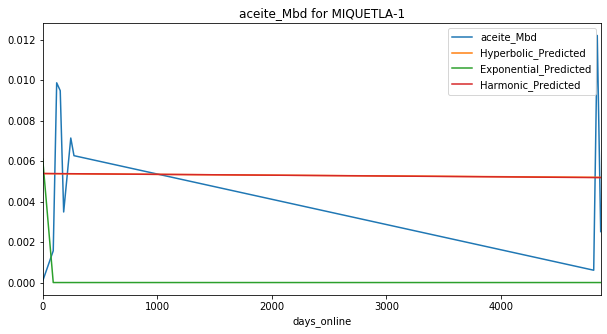

288.45564239999993

In [37]:
import timeit
tic=timeit.default_timer()

def read_in_csv(file_path):
    """
    Read in the specified csv as a pandas dataframe
    Arguments: 
        file_path: String. Path for the csv file that we want to read in
    Outputs:
        dataframe: Pandas dataframe.
    """
    well_data=pd.read_csv(file_path,parse_dates=True,index_col=0)
    return well_data

def remove_nan_and_zeroes_from_columns(df, variable):
    """
    This function cleans up a dataframe by removing rows in a specific 
    column that are null/NaN or equal to 0. This basically removes zero 
    production time periods.
    Arguments:
        df: Pandas dataframe.
        variable: String. Name of the column where we want to filter out
        NaN's or 0 values
    Output:
        filtered_df: Pandas dataframe. Dataframe with NaN's and zeroes filtered out of 
        the specified column
    """
    filtered_df = df[(df[variable].notnull()) & (df[variable]>0)]
    return filtered_df

def generate_time_delta_column(df, time_column, date_first_online_column):
    """
    Create column for the time that a well has been online at each reading, with 
    the first non-null month in the series listed as the start of production
    Arguments:
        df: Pandas dataframe
        time_column: String. Name of the column that includes the specific record date
        that the data was taken at. Column type is pandas datetime
        date_first_online_column: Name of the column that includes the date that the
        well came online. Column type is pandas datetime
    Outputs:
        Pandas series containing the difference in days between the date the well
        came online and the date that the data was recorded (cumulative days online)
    """
    df['Dias Produciendo']=(df[time_column]-df[date_first_online_column]).dt.days
    return (df[time_column]-df[date_first_online_column]).dt.days

def get_min_or_max_value_in_column_by_group(dataframe, group_by_column, calc_column, calc_type):
    global value
    """
    This function obtains the min or max value for a column, with a group by applied. For example,
    it could return the earliest (min) RecordDate for each API number in a dataframe 
    Arguments:
        dataframe: Pandas dataframe 
        group_by_column: string. Name of column that we want to apply a group by to
        calc_column: string. Name of the column that we want to get the aggregated max or min for
        calc_type: string; can be either 'min' or 'max'. Defined if we want to pull the min value 
        or the max value for the aggregated column
    Outputs:
        value: Depends on the calc_column type.
    """
    value=dataframe.groupby(group_by_column)[calc_column].transform(calc_type)
    return value

def get_max_initial_production(df, number_first_months, variable_column, date_column):
    global df_beginning_production
    """
    This function allows you to look at the first X months of production, and selects 
    the highest production month as max initial production
    Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
    """
    #First, sort the data frame from earliest to most recent prod date
    df=df.sort_values(by=date_column)
    #Pull out the first x months of production, where number_first_months is x
    df_beginning_production=df.head(number_first_months)
    #Return the max value in the selected variable column from the newly created 
    #df_beginning_production df
    return df_beginning_production[variable_column].max()

def hyperbolic_equation(t, qi, b, di):
    """
    Hyperbolic decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        b: Float. Hyperbolic decline constant
        di: Float. Nominal decline rate at time t=0
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi/((1.0+b*di*t)**(1.0/b))

def exponential_equation(t, qi, di):
    """
    Exponential decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi*np.exp(-di*t)

def harmonic_equation (t, qi, di):
    """
    Harmonic decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi/(1+(di*t))

def plot_actual_vs_predicted_by_equations(df, x_variable, y_variables, plot_title):
    """
    This function is used to map x- and y-variables against each other
    Arguments:
        df: Pandas dataframe.
        x_variable: String. Name of the column that we want to set as the 
        x-variable in the plot
        y_variables: string (single), or list of strings (multiple). Name(s) 
        of the column(s) that we want to set as the y-variable in the plot
    """
    #Plot results
    df.plot(x=x_variable, y=y_variables, title=plot_title,figsize=(10,5))
    plt.show()

def main(file_path):
    global well_data
    global results
    results=pd.DataFrame()
    #Read the oil and gas data
    well_data=read_in_csv(file_path)
    #Perform some data cleaning to get the columns as the right data type
    well_data['fecha']=pd.to_datetime(well_data['fecha'])
    #Declare the desired product that we want to curve fit for--it can either by 'Gas' or 'Oil'
    hydrocarbon='aceite_Mbd'
    #Remove all rows with null values in the desired time series column
    well_data=remove_nan_and_zeroes_from_columns(well_data, hydrocarbon)
    #Get a list of unique wells to loop through
    unique_well_list=pd.unique(list(well_data.pozo))
    #Get the earliest RecordDate for each Well
    well_data['first_oil']= get_min_or_max_value_in_column_by_group(well_data, group_by_column='pozo', 
                  calc_column='fecha', calc_type='min')
    #Generate column for time online delta
    well_data['days_online']=generate_time_delta_column(well_data, time_column='fecha', 
                  date_first_online_column='first_oil')
    #Pull data that came online between an specified range
    well_data_range=well_data[(well_data.fecha>='1900-01-01') & (well_data.fecha<='2019-12-01')]
    #Loop through each well, and perform calculations
    for pozo in unique_well_list:
        #Subset the dataframe by Well
        production_time_series=well_data_range[well_data_range.pozo==pozo]
        #Get the highest value of production in the first X months of production, to use as qi value
        qi=get_max_initial_production(production_time_series, 12, hydrocarbon, 'fecha')
        #Exponential curve fit the data to get best fit equation
        popt_exp, pcov_exp=curve_fit(exponential_equation, production_time_series['days_online']+12, 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,20]))
        print('Exponential Fit Curve-fitted Variables: qi='+str(popt_exp[0])+', di='+str(popt_exp[1]))
        #Hyperbolic curve fit the data to get best fit equation
        popt_hyp, pcov_hyp=curve_fit(hyperbolic_equation, production_time_series['days_online']+12, 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,2,20]))
        print('Hyperbolic Fit Curve-fitted Variables: qi='+str(popt_hyp[0])+', b='+str(popt_hyp[1])+', di='+str(popt_hyp[2]))
        #Harmonic curve fit the data to get best fit equation
        popt_harm, pcov_harm=curve_fit(harmonic_equation, production_time_series['days_online']+12, 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,20]))
        print('Harmonic Fit Curve-fitted Variables: qi='+str(popt_harm[0])+', di='+str(popt_harm[1]))
        #Exponential fit results
        production_time_series.loc[:,'Exponential_Predicted']=exponential_equation(production_time_series['days_online'], 
                                  *popt_exp)
    
        #Hyperbolic fit results
        production_time_series.loc[:,'Hyperbolic_Predicted']=hyperbolic_equation(production_time_series['days_online'], 
                                  *popt_hyp)
        #Harmonic fit results
        production_time_series.loc[:,'Harmonic_Predicted']=harmonic_equation(production_time_series['days_online'], 
                                  *popt_harm)
        
        production_time_series.loc[:,'Qi']=popt_harm[0]
        
        #Declare the x- and y- variables that we want to plot against each other
        y_variables=[hydrocarbon,"Hyperbolic_Predicted", "Exponential_Predicted", "Harmonic_Predicted"]
        x_variable='days_online'
        #Create the plot title
        plot_title=hydrocarbon+' for '+str(pozo)
        #Plot the data to visualize the equation fit
        plot_actual_vs_predicted_by_equations(production_time_series, x_variable, y_variables, plot_title)
        
        results=results.append(production_time_series)
    
    results.to_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/'+str(input_campo)+'_dca.csv')
    
if __name__== "__main__":
    main(r'C:/Users/elias/Google Drive/python/csv/benchmark/MIQUETLA.csv')

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

In [8]:
df=pd.read_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/MIQUETLA_dca.csv',
              index_col=0)

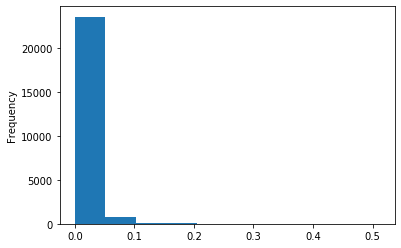

In [9]:
df.Harmonic_Predicted.plot.hist()

In [10]:
df.describe()

,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted,Qi
count,"24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00"
mean,0.02,0.00,0.00,0.04,0.00,"8,758.65","8,758.65",0.00,0.02,0.02,0.15
std,0.03,0.01,0.00,0.07,0.00,"5,167.27","5,167.27",0.01,0.02,0.02,0.11
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.01,0.00,0.00,0.01,0.00,"4,352.00","4,352.00",0.00,0.01,0.01,0.04
50%,0.01,0.00,0.00,0.02,0.00,"8,309.00","8,309.00",0.00,0.02,0.02,0.13
75%,0.03,0.00,0.00,0.05,0.00,"13,758.00","13,758.00",0.00,0.02,0.03,0.22
max,0.72,0.38,0.00,1.06,0.03,"19,631.00","19,631.00",0.26,0.51,0.51,0.51


In [13]:
display(df.Qi.quantile([.1,.5,.9]))

0.10   0.02
0.50   0.13
0.90   0.29
Name: Qi, dtype: float64

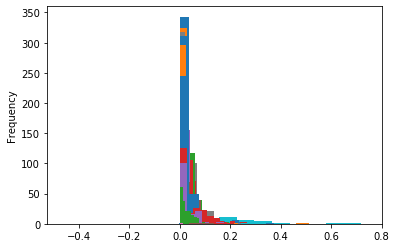

In [14]:
unique_well_list=pd.unique(list(df.pozo))

for x in unique_well_list:
        df2=df[df.pozo==x]
        display(df2.aceite_Mbd.plot.hist())

In [45]:
def productividad():
    global campo
    global unique_well_list
    global input_campo
    
    tic=timeit.default_timer()
    
    mx_stats=pd.read_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                         index_col=0,
                         low_memory=False)
    
    display('Numero de datos en BD: '+str(len(mx_stats)))
    
    input_campo = input("Nombre de Campo: ")
    
    selected_rows=mx_stats.pozo.str.contains(str(input_campo))
    campo=mx_stats.loc[selected_rows]

    display('Numero de datos para '+str(input_campo)+': ' +str(len(campo)))
    
    unique_well_list=pd.unique(campo['pozo'])

    display('Número de pozos en ' +str(input_campo)+': '+str(len(unique_well_list)),
            unique_well_list)

    display(campo.aceite_Mbd.quantile([.1,.5,.9]),
            campo.describe())  

    dst=Distribution()
    display(dst.Fit(campo.aceite_Mbd))
    dst.Plot(campo.aceite_Mbd)
    
    campo.to_csv(r'C:/Users/elias/Google Drive/python/csv/benchmark/'+str(input_campo)+str('.csv'))
    
    toc=timeit.default_timer()
    tac= toc - tic #elapsed time in seconds
    
    return display('Tiempo de procesamiento: ' +str(tac)+' segundos')

'Numero de datos en BD: 2838332'

Nombre de Campo: MIQUETLA


'Numero de datos para MIQUETLA: 24691'

'Número de pozos en MIQUETLA: 137'

array(['MIQUETLA-102', 'MIQUETLA-103', 'MIQUETLA-104', 'MIQUETLA-105',
       'MIQUETLA-106', 'MIQUETLA-107', 'MIQUETLA-108', 'MIQUETLA-109',
       'MIQUETLA-111', 'MIQUETLA-112', 'MIQUETLA-114', 'MIQUETLA-116',
       'MIQUETLA-121', 'MIQUETLA-122', 'MIQUETLA-124', 'MIQUETLA-15',
       'MIQUETLA-17', 'MIQUETLA-19', 'MIQUETLA-2', 'MIQUETLA-20',
       'MIQUETLA-22', 'MIQUETLA-23A', 'MIQUETLA-24', 'MIQUETLA-26',
       'MIQUETLA-27', 'MIQUETLA-28', 'MIQUETLA-29', 'MIQUETLA-3',
       'MIQUETLA-3134', 'MIQUETLA-32', 'MIQUETLA-33', 'MIQUETLA-3371',
       'MIQUETLA-35', 'MIQUETLA-356', 'MIQUETLA-36', 'MIQUETLA-39',
       'MIQUETLA-4', 'MIQUETLA-43', 'MIQUETLA-45', 'MIQUETLA-46',
       'MIQUETLA-47', 'MIQUETLA-51', 'MIQUETLA-52', 'MIQUETLA-57',
       'MIQUETLA-58', 'MIQUETLA-60', 'MIQUETLA-61', 'MIQUETLA-63',
       'MIQUETLA-64', 'MIQUETLA-66', 'MIQUETLA-677', 'MIQUETLA-67A',
       'MIQUETLA-73', 'MIQUETLA-744', 'MIQUETLA-78', 'MIQUETLA-79',
       'MIQUETLA-80', 'MIQUETLA-81', 'MIQ

0.10   0.00
0.50   0.01
0.90   0.04
Name: aceite_Mbd, dtype: float64

,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"24,691.00","24,691.00","24,691.00","24,691.00","24,691.00"
mean,0.02,0.00,0.00,0.04,0.00
std,0.03,0.01,0.00,0.07,0.04
min,0.00,0.00,0.00,0.00,0.00
25%,0.01,0.00,0.00,0.01,0.00
50%,0.01,0.00,0.00,0.02,0.00
75%,0.03,0.00,0.00,0.05,0.00
max,0.72,0.38,0.00,1.06,1.69


('lognorm', 4.987298569425703e-19)

'Tiempo de procesamiento: 28.40967230000024 segundos'

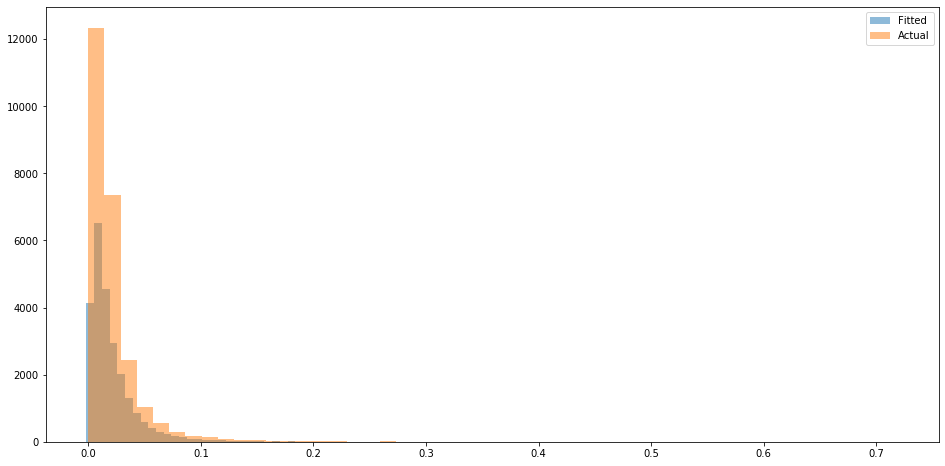

In [48]:
productividad()